<a href="https://colab.research.google.com/github/milieureka/Road_Sign_Classification_using_CNN/blob/main/Road_Sign_Classification_using_Deep_Learning.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Road Sign Classification using Deep Learning**

**Background** Autonomous vehicles have come a long way in the last decade, and promises to be part of our daily lives in the very near future. One of the key challenges, however, is to ensure that these vehicles are capable of identifying road signs. In this project, you will train a deep learning model to robustly identify as many road signs as possible. A few examples of road signs used in Victoria can be found [here](https://www.vicroads.vic.gov.au/safety-and-road-rules/road-rules/a-to-z-of-road-rules/road-signs).

As seen from the link, the number of road signs is quite large, and it may be challenging to correctly identify all of these signs with a good degree of accuracy. You may thus choose to instead, simplify the task by solving a carefully chosen sub-problem (eg: limiting your model to identify only critical signs  - stop signs, speed limits and school zone signs, or say, focusing on more broadly classifying regulatory vs warning vs freeway signs etc.,).

#### 1.1 Define a problem

**Problem Description**

In this project, I develop a deep learning model capable of identifying and classifying four critical road signs, which are:
- Pedestrian crossing signs,
- Speedlimit signs,   
- Stop signs,
- Trafficlight.

The dataset contains 877 real-world images, loaded from Kaggle. Considering the given background, the objective is to enhance road safety for autonomous vehicles, therefore I introduce various different type of label so the model can detect a comprehensive type of road signs.

**Theoretical Challenges**:
1. **Class Imbalance**: The data distribution is skewed, with the Speed Limit class accounting for approximately 76% of the dataset. Although I could choose a balanced dataset, real-world data is often imbalanced. Therefore, addressing this class imbalance issue is crucial for my model's applicability in real scenarios.
2. **Variability in Conditions**: As the dataset comprises real-world images, these include varying backgrounds, such as landscapes and trees, and the objects of interest are not always centrally located. Moreover, the natural illumination conditions, such as changes in daylight or weather, can significantly affect the visibility and appearance of the road signs, adding further complexity to their detection.
3. **Inter-class Similarity**: Some signs share similar shapes; for example, Stop signs are octagonal and Speed Limit signs are circular, which can be visually similar, posing a challenge in classification between these critical classes accurately.

**Practical Challenges**:
1. **Computational Budget Considerations**: Operating within the constraints of a limited computational budget, particularly when utilizing free Google Colab GPU resources, might lead to very long computation time. The entire assignment requires substantial computation because the training process will be heavily utilized. Given these demands, opting for a higher-tier GPU may become necessary to handle intensive computations effectively, ensuring the model's performance and real-time capabilities are not compromised.
2. **Model Complexity and Training**: Given the relatively small size of the dataset (only around 800 images) and requiremnt to build CNN model from scratch is challenging. A relatively small dataset can negatively affect the performance of a DL model due to overfitting. It isn’t possible to train a convolutional network with just a few tens of samples, but a few hundred can potentially suffice if the model is small, well-regularized, and the task is straightforward.

**Desired Inputs and Outputs**:
- **Inputs**:
  - Type: Image tensor.
  - Shape: (Height, Width, Channels) or (N, H, W, C) for batch dataset with N is batch size.
  - Data Range: Pixel values are normalized between 0 and 1.
- **Outputs**:
  - Type: Probability distribution over K classes.
  - Shape: (N, K) for batch dataset.
  - Predicted Class: The class with the highest probability is considered the model's prediction for that input.
- **Target Classes**:
  - Pedestrian crossing signs: These warn drivers about potential pedestrian crossings ahead. They typically feature a symbol of a walking leg. Although this dataset does not explicitly include Australian pedestrian crossing signs, it contains signs with similar features, such as the triangular shape of the signs.
  - Speed limit signs: These indicate the maximum legal speed for a road section. They're usually circular with a number indicating the speed limit (e.g., 30, 50, 70 km/h).
  - Stop signs: These are octagonal signs with the word "STOP" written on them, usually in white text on a red background.
  - Traffic light: These lights cycle through three standard colors: red, blue, yellow.

### 1.2 Make a plan


I am utilizing a publicly available traffic road sign dataset from Kaggle, originally intended for object detection tasks in computer vision, but it is also suitable for classification tasks.

This dataset comprises 877 images spanning four distinct classes. While a larger dataset of hundred thousand images would be ideal for enhancing the model's robustness and generalization capabilities, constraints such as limited data availability and resource considerations necessitated the use of the available dataset.

The distribution of classes within the dataset is as follows:

| Class        | Count |
|--------------|-------|
| speedlimit   | 652   |
| crosswalk    | 88    |
| stop         | 76    |
| trafficlight | 61    |

I will follow the standard practice of splitting the dataset into 70% for training (614 images), and 15% each for validation and testing (131 images each). This division is standard as it allows for a substantial amount of data to train the model while providing adequate samples to validate and test the model's performance. The 70-15-15 split ensures that the model is not overfitting on the training data and generalizes well on unseen data, which is crucial for deploying robust machine learning models in real-world applications.

Determining whether the model is good enough involves evaluating its performance on a validation or test dataset using relevant metrics such as accuracy, loss, precision, recall, and F1-score. If the model meets or exceeds predefined performance benchmarks and generalizes well to unseen data without overfitting, it can be considered satisfactory.

Some success criteria can be predefined:
- High accuracy & F1-score on validation/test Data.
- Low loss value.
- Balanced precision and recall across all classes.

### 1.3 Implement a solution

In [ ]:
# Install necessary packages
%pip install -q git+https://github.com/tensorflow/docs torch torchvision

  Preparing metadata (setup.py) ... done


In [ ]:
# Import libraries
import pandas as pd
import os, shutil, pathlib
import tensorflow as tf
import matplotlib.pyplot as plt
import numpy as np
from tabulate import tabulate
import os
from PIL import Image
from tensorflow.keras import Input
import tensorflow_docs as tfdocs
import tensorflow_docs.plots
from sklearn.metrics import confusion_matrix
import seaborn as sns

In [ ]:
# Load available dataset from Kaggle
!kaggle datasets download -d andrewmvd/road-sign-detection

Dataset URL: https://www.kaggle.com/datasets/andrewmvd/road-sign-detection
License(s): CC0-1.0
 99% 216M/218M [00:07<00:00, 31.3MB/s]
100% 218M/218M [00:07<00:00, 29.1MB/s]


In [ ]:
!unzip -qq road-sign-detection.zip -d ./road-sign-detection

**Structure the Dataset**

Since the dataset is loaded with a folder of images and a label file in XML format, to make it compatible with the Keras framework, I need to restructure the dataset. Then, can use TensorFlow’s `image_dataset_from_directory` function to load these images into a dataset.

    speedlimit/
        image1.jpg
        image2.jpg
        ...
    crosswalk/
        image1.jpg
        image2.jpg
        ...
    stop/
        image1.jpg
        image2.jpg
        ...
    trafficlight/
        image1.jpg
        image2.jpg
        ...

In [ ]:
#class folder
img_id = []
img_class = []

for i in os.listdir('/content/road-sign-detection/annotations'):
    #read each xml file
    path=os.path.join('/content/road-sign-detection/annotations',i)
    xml=pd.read_xml(path)
    #id and class list
    img_id.append(xml.iloc[1,1])
    img_class.append(xml.loc[4,'name'])

#create df
data = pd.DataFrame({'id': img_id, 'class': img_class})

In [ ]:
# Check distribution of the label class
data['class'].value_counts()

,count
class,
speedlimit,652
crosswalk,88
stop,76
trafficlight,61


In [ ]:
# Define the base path for the original images
original_dir = pathlib.Path("road-sign-detection") / "images"

# Define the base path for the new organized dataset
new_base_dir = original_dir

# Function to create subfolders and move files
def organize_images(data):
    # Iterate over the rows in the DataFrame
    for index, row in data.iterrows():
        # Construct the full original path of the image
        src_path = original_dir / row['id']

        # Construct the destination path based on the class label
        dst_dir = new_base_dir / row['class']
        dst_path = dst_dir / row['id']

        # Create the directory if it does not exist
        os.makedirs(dst_dir, exist_ok=True)

        # Move the file from src to dst
        shutil.move(str(src_path), str(dst_path))

# Call the function to organize images
organize_images(data)

After moving the images to the designated folders, double-check the value counts of each folder to confirm that each label was correctly stored in the appropriate folder. The number is matched with the count from label dataframe

In [ ]:
# Checking the number of variable
print(f"Speed limit images: {len(os.listdir('/content/road-sign-detection/images/speedlimit'))}")
print(f"Crosswalk images: {len(os.listdir('/content/road-sign-detection/images/crosswalk'))}")
print(f"Stop images: {len(os.listdir('/content/road-sign-detection/images/stop'))}")
print(f"Traffic light images: {len(os.listdir('/content/road-sign-detection/images/trafficlight'))}")

Speed limit images: 652
Crosswalk images: 88
Stop images: 76
Traffic light images: 61


Keras features the utility function image_dataset_from_ directory(), which can quickly set up a data pipeline that automatically turn image files on disk into batches of preprocessed tensors.

Calling image_dataset_from_directory (directory) will first list the subdirectories of directory and assume each one contains images from one of our classes. It will then index the image files in each subdirectory. Finally, it will create and return a tf.data.Dataset object configured to read these files, shuffle them, decode them to tensors, resize them to a shared size, and pack them into batches.

In [ ]:
train_ds, val_ds = tf.keras.utils.image_dataset_from_directory(
    directory = new_base_dir,
    label_mode='categorical',
    validation_split = 0.3,
    subset = 'both',
    seed = 2)

Found 877 files belonging to 4 classes.
Using 614 files for training.
Using 263 files for validation.


In [ ]:
val_batches = tf.data.experimental.cardinality(val_ds)
test_ds = val_ds.take((2*val_batches) // 3)
val_ds = val_ds.skip((2*val_batches) // 3)

In [ ]:
# Function to count the sample in each dataset
def count_samples_per_class(dataset, class_names):
    # Initialize a dictionary to store the count of each class
    class_counts = {class_name: 0 for class_name in class_names}

    # Iterate over all batches in the dataset
    for images, labels in dataset:
        # Sum over columns of the label array to get counts for each class
        counts = np.sum(labels.numpy(), axis=0)
        for i, count in enumerate(counts):
            class_counts[class_names[i]] += count

    return class_counts

# Get class names from the training dataset
class_names = train_ds.class_names

# Count samples in each dataset
train_counts = count_samples_per_class(train_ds, class_names)
val_counts = count_samples_per_class(val_ds, class_names)
test_counts = count_samples_per_class(test_ds, class_names)

# Print the results
print(tabulate([['Train'] + list(train_counts.values()),
                ['Validation'] + list(val_counts.values()),
                ['Test'] + list(test_counts.values())],
               headers=['Dataset'] + class_names))


Dataset       crosswalk    speedlimit    stop    trafficlight
----------  -----------  ------------  ------  --------------
Train                55           467      54              38
Validation            5            54       7               5
Test                 28           131      15              18


Visualize the samples in each batch; there is a noticeable skew in the label at index 1 and the fewest samples at index 4. This class imbalance needs to be addressed when defining the model.

Batch 1 Class Distribution: [ 3. 26.  2.  1.]


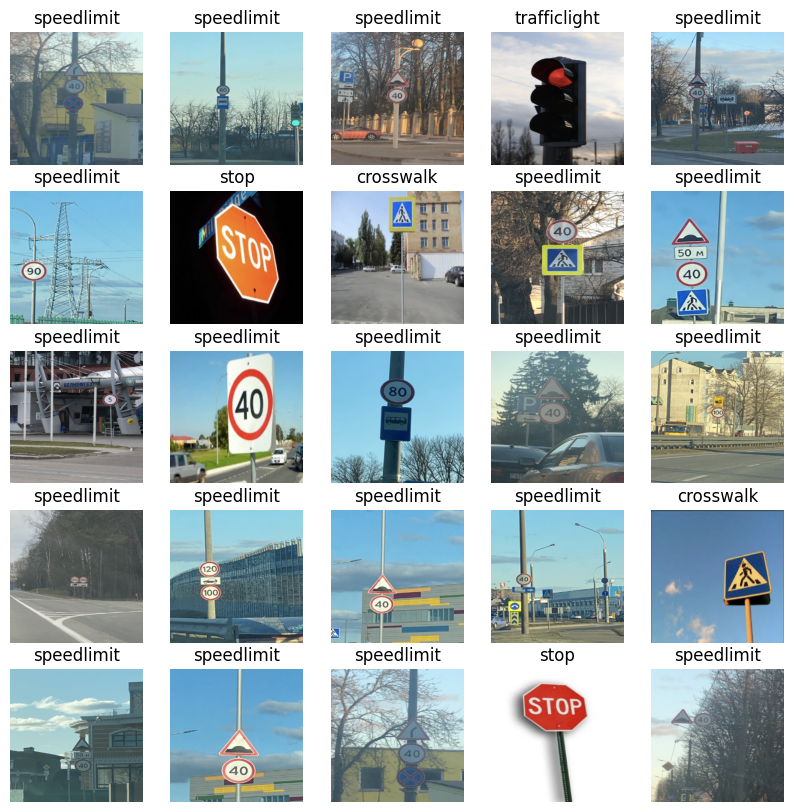

Batch 2 Class Distribution: [ 2. 22.  6.  2.]


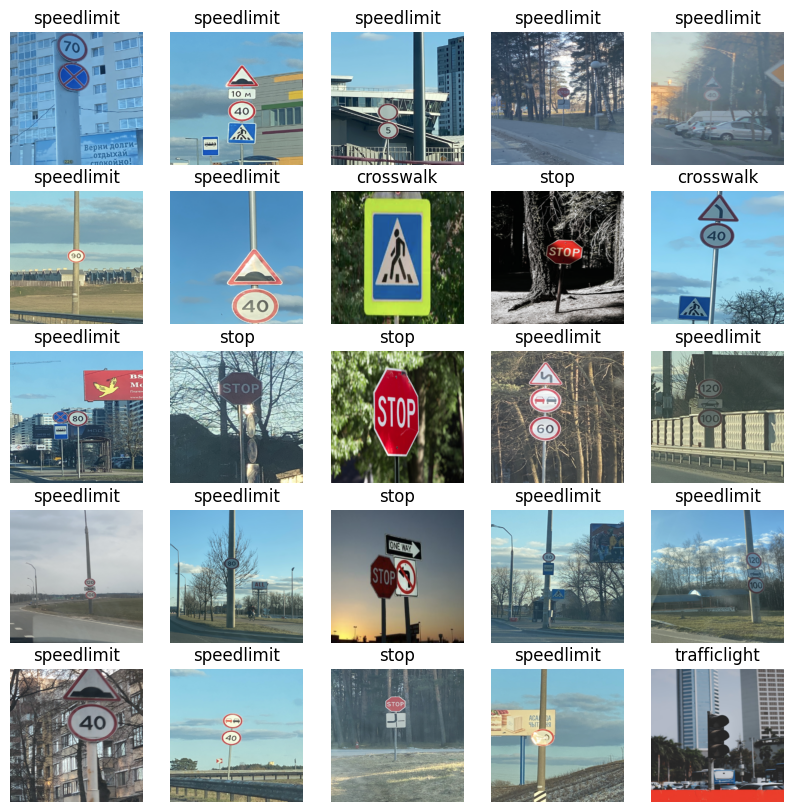

Batch 3 Class Distribution: [ 1. 28.  1.  2.]


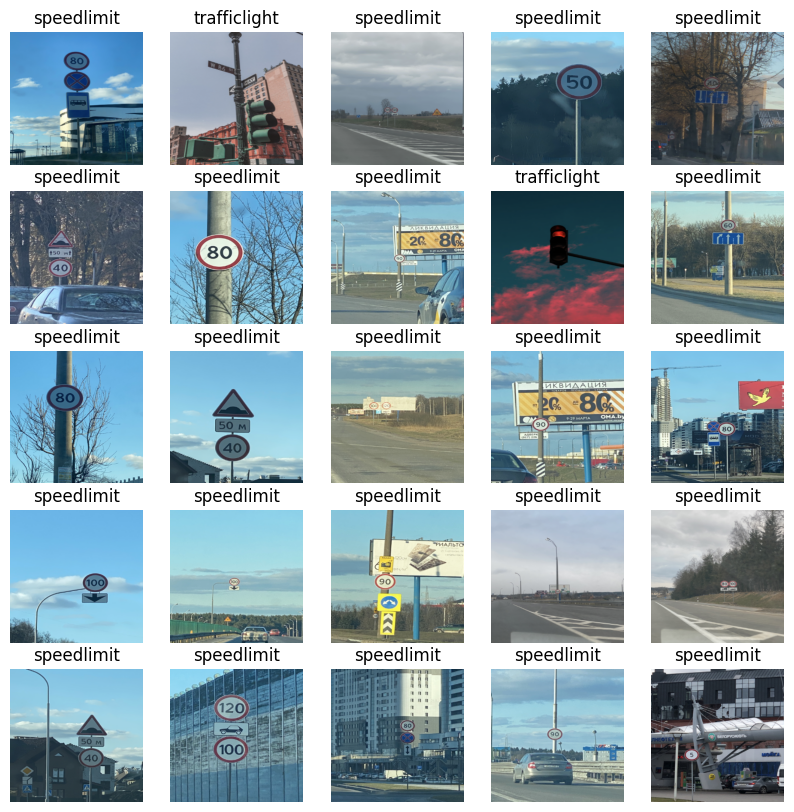

In [ ]:
# Function to plot images from a single batch
def plot_images_from_batch(images, labels):
    plt.figure(figsize=(10, 10))
    for i in range(min(25, len(images))):
        ax = plt.subplot(5, 5, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        class_index = np.argmax(labels[i])
        plt.title(class_names[class_index])
        plt.axis("off")
    plt.show()

# Inspect the first few batches
for batch_index, (images, labels) in enumerate(train_ds.take(3)):  # Taking first 3 batches
    print(f"Batch {batch_index + 1} Class Distribution: {np.sum(labels.numpy(), axis=0)}")
    plot_images_from_batch(images, labels)


In [ ]:
# Checking the input shape
for image_batch, labels_batch in train_ds:
  print(image_batch.shape)
  print(labels_batch.shape)
  break

(32, 256, 256, 3)
(32, 4)


**Preprocess**

In [ ]:
AUTOTUNE = tf.data.AUTOTUNE

def pre_process_image(image, label):
    image = tf.image.convert_image_dtype(image, tf.float32)  # Cast and normalize the image to [0,1]
    return image, label

After preprocessing, configure the dataset for performance by using buffered prefetching. This yield data from disk without having I/O become a bottleneck. Additionally, implement data prefetching using AUTOTUNE, which preprocesses the next batch of data while the previous one is being handled by the model, keeping the execution flowing smoothly without interruptions.

In [ ]:
# Apply preprocessing and then cache the datasets
train_ds = train_ds.map(pre_process_image).cache().shuffle(1000).repeat().prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.map(pre_process_image).cache().prefetch(buffer_size=AUTOTUNE)
test_ds = test_ds.map(pre_process_image).cache().prefetch(buffer_size=AUTOTUNE)

**Build a Convolution network model**

- The convolutional layers have filters that increase with depth (32 ➔ 64 ➔ 128 ➔ 256). The first layer captures low-level features such as edges and textures. Following this, a max-pooling layer is employed to perform downsampling, reducing the spatial dimensions by half, effectively decreasing computational load and helping to control overfitting. The network continues with a series of four more convolutional and max-pooling layers, allowing the model to learn more complex features at each layer.
- To complete the model, the last output tensor from the convolutional base (of shape (None, 6, 6, 256)) will be fed into two Dense layers to perform classification. Dense layers take vectors as input (which are 1D), while the current output is a 3D tensor. Therefore, a flatten layer is used to transform the 3D output into a 1D vector before adding the Dense layers on top. To prevent overfitting, dropout regularization is applied after this dense layer by randomly dropping neurons during training. My dataset has four output classes, so the final Dense layer return four outputs.

In [ ]:
def make_model(output_bias=None):
    # Since the dataset is imbalanced. Set the output layer's bias to reflect that,
    if output_bias is not None:
        output_bias = tf.keras.initializers.Constant(output_bias)

    model = tf.keras.Sequential([
        # Add an explicit input layer
        tf.keras.layers.Input(shape=(256, 256, 3)),

        # Convolutional base
        tf.keras.layers.Conv2D(32, (3, 3), activation='relu'),
        tf.keras.layers.MaxPooling2D(2, 2),

        tf.keras.layers.Conv2D(64, (3, 3), activation='relu'),
        tf.keras.layers.MaxPooling2D(2, 2),

        tf.keras.layers.Conv2D(128, (3, 3), activation='relu'),
        tf.keras.layers.MaxPooling2D(2, 2),

        tf.keras.layers.Conv2D(256, (3, 3), activation='relu'),
        tf.keras.layers.MaxPooling2D(2, 2),

        tf.keras.layers.Conv2D(256, (3, 3), activation='relu'),
        tf.keras.layers.MaxPooling2D(2, 2),

        # Dense head
        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(512, activation='relu'),
        tf.keras.layers.Dropout(0.5),

        # Output layer with 4 classes, softmax activation and bias initializer for imbalance
        tf.keras.layers.Dense(4, activation='softmax', bias_initializer=output_bias)
    ])

    # Compile the model with specified optimizer, loss, and metrics
    model.compile(
        optimizer=tf.keras.optimizers.Adam(
            learning_rate=tf.keras.optimizers.schedules.ExponentialDecay(
                initial_learning_rate=0.001,
                decay_steps=100,
                decay_rate=0.96
            )
        ),
        loss='categorical_crossentropy',
        metrics=[
            tf.keras.metrics.CategoricalAccuracy(name='accuracy'),
            tf.keras.metrics.Precision(),
            tf.keras.metrics.Recall(),
            tf.keras.metrics.F1Score(average='weighted', threshold=0.3),
            # AUC for multi-class classification
            tf.keras.metrics.AUC(multi_label=True, num_labels=4, curve='ROC', name='ROC_AUC')
        ]
    )

    return model

model = make_model()
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 254, 254, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 127, 127, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 125, 125, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 62, 62, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 60, 60, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 30, 30, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 28, 28, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_3 (MaxPooling2D)       │ (None, 14, 14, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_4 (Conv2D)                    │ (None, 12, 12, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_4 (MaxPooling2D)       │ (None, 6, 6, 256)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 9216)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 512)                 │       4,719,104 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 4)                   │           2,052 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 5,699,652 (21.74 MB)

 Trainable params: 5,699,652 (21.74 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
%%time

model = make_model()

history = model.fit(
      train_ds,
      steps_per_epoch=100,
      epochs=10,
      validation_data=val_ds,
      callbacks=[
          tf.keras.callbacks.ModelCheckpoint('my-model-{val_accuracy:.2f}.keras', monitor='val_accuracy', verbose=1, save_best_only=True, mode='max')]
      )

model.save('my_model.keras')

Epoch 1/10
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step - ROC_AUC: 0.5799 - accuracy: 0.6710 - f1_score: 0.6429 - loss: 9.6952 - precision_1: 0.6815 - recall_1: 0.6526
Epoch 1: val_accuracy improved from -inf to 0.80282, saving model to my-model-0.80.keras
100/100 ━━━━━━━━━━━━━━━━━━━━ 38s 221ms/step - ROC_AUC: 0.5806 - accuracy: 0.6718 - f1_score: 0.6435 - loss: 9.6292 - precision_1: 0.6823 - recall_1: 0.6534 - val_ROC_AUC: 0.7361 - val_accuracy: 0.8028 - val_f1_score: 0.7338 - val_loss: 0.6909 - val_precision_1: 0.8116 - val_recall_1: 0.7887
Epoch 2/10
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step - ROC_AUC: 0.8003 - accuracy: 0.8258 - f1_score: 0.7919 - loss: 0.5807 - precision_1: 0.8352 - recall_1: 0.8130
Epoch 2: val_accuracy did not improve from 0.80282
100/100 ━━━━━━━━━━━━━━━━━━━━ 11s 108ms/step - ROC_AUC: 0.8005 - accuracy: 0.8260 - f1_score: 0.7922 - loss: 0.5803 - precision_1: 0.8353 - recall_1: 0.8132 - val_ROC_AUC: 0.7513 - val_accuracy: 0.7887 - val_f1_score: 0.7538 - val_loss: 

**Set the correct initial bias**

According to [Tensorflow intruction](https://www.tensorflow.org/tutorials/structured_data/imbalanced_data#build_the_model), one straighforward technique to deal with imbalanced dataset is setting the correct bias. Neural network bias can be defined as the constant which is added to the product of features and weights. It is used to offset the result. It helps the models to shift the activation function towards the positive or negative side. This expect to reduce the loss score.

There are also other techniques to handle imbalanced classes, such as oversampling or adjusting class weights. However, as mentioned in the tutorial, in the end, changing the output bias is more or less equivalent to using class weights or changing the threshold.

**Adjusting Bias for Multi-Class Classification**

The bias for each class can be expressed as:

$$ \text{bias}_i = \ln(p_i) $$

where $ p_i $  is the prior probability of class $i$.

By setting the bias for minority classes to negative values (based on their low occurrence), help to reduce the likelihood of the model prematurely overfitting to the more frequent classes and encourage the model to pay more attention to minority classes

In [ ]:
counts = np.array([55, 467, 54, 38])
total_counts = np.sum(counts)
probabilities = counts / total_counts

# Calculate bias
biases = np.log(probabilities)

# Set the reference class bias to 0
biases -= biases[1]  # Normalize to make the largest class bias

print("Class probabilities:", probabilities)
print("Initial biases for each class:", biases)

Class probabilities: [0.08957655 0.76058632 0.08794788 0.06188925]
Initial biases for each class: [-2.13899607  0.         -2.15734521 -2.5087431 ]


By tracking the loss score behavior during each epoch, can see the loss score increases, it often indicate that the learning rate is too high, causing the model to overshoot the minimum. Therefore, setting a smaller learning rate might help.

In [ ]:
def set_initial_learning_rate(model, new_initial_lr):
    new_lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
        initial_learning_rate=new_initial_lr,
        decay_steps=1000,
        decay_rate=0.96
    )
    model.optimizer.learning_rate = new_lr_schedule

In [ ]:
model_2 = make_model(output_bias=biases)

new_initial_lr = 1e-5
set_initial_learning_rate(model_2, new_initial_lr)

model_history = model_2.fit(
      train_ds,
      steps_per_epoch=100,
      epochs=10,
      validation_data=val_ds,
      callbacks=[
          tf.keras.callbacks.ModelCheckpoint('model_2-{val_accuracy:.2f}.keras', monitor='val_accuracy', verbose=1, save_best_only=True, mode='max')]
      )

model_2.save('model_2.keras')

Epoch 1/10
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step - ROC_AUC: 0.5383 - accuracy: 0.6050 - f1_score: 0.6176 - loss: 5.8800 - precision_2: 0.6085 - recall_2: 0.6031
Epoch 1: val_accuracy improved from -inf to 0.77465, saving model to model_2-0.77.keras
100/100 ━━━━━━━━━━━━━━━━━━━━ 24s 183ms/step - ROC_AUC: 0.5387 - accuracy: 0.6054 - f1_score: 0.6180 - loss: 5.8608 - precision_2: 0.6089 - recall_2: 0.6035 - val_ROC_AUC: 0.5979 - val_accuracy: 0.7746 - val_f1_score: 0.7324 - val_loss: 1.7522 - val_precision_2: 0.7746 - val_recall_2: 0.7746
Epoch 2/10
 99/100 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - ROC_AUC: 0.7100 - accuracy: 0.7191 - f1_score: 0.7247 - loss: 1.5603 - precision_2: 0.7265 - recall_2: 0.7145
Epoch 2: val_accuracy improved from 0.77465 to 0.78873, saving model to model_2-0.79.keras
100/100 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - ROC_AUC: 0.7106 - accuracy: 0.7195 - f1_score: 0.7251 - loss: 1.5538 - precision_2: 0.7269 - recall_2: 0.7149 - val_ROC_AUC: 0.6840 - val_accuracy: 0.78

**Confirming the Impact of Bias Fix**:

After applying the bias adjustment, the model's loss score is approximately **2.7 times lower** compared to normal initialization. While the accuracy decreases, this should be viewed as a positive outcome. The reduced accuracy indicates that the model is no longer heavily biased towards the majority class (speedlimit) due to class imbalance. Instead, the model has begun making predictions across the minority classes, rather than consistently predicting the dominant class. This shift demonstrates that the model is learning to balance predictions more effectively, even if it results in an initial drop in accuracy.

Accuracy, however, can be misleading in imbalanced datasets. More informative metrics such as **Precision**, **Recall**, **F1 Score**, and **ROC AUC (Area Under the Receiver Operating Characteristic Curve)** provide a better understanding of the model’s performance across all classes. In the bias-adjusted model, the **ROC AUC** score is higher, indicating an improved ability to distinguish between different classes. This improvement highlights the model’s ability to better identify minority classes, which is essential when dealing with imbalanced datasets, even though accuracy alone may not reflect this progress.

However, when analyzing the training process plot, the accuracy appears to stagnate, which could be a sign of overfitting. To address this, we can try adding more data through augmentation and observe the impact on the model's performance.

In [ ]:
# Evaluate the model on the new test dataset
model_results = tf.keras.models.load_model('my-model.keras').evaluate(test_ds)
moedel_2_results = tf.keras.models.load_model('model_2.keras').evaluate(test_ds)

# Print the results
print(tabulate([['Model', 'Loss', 'Accuracy', 'Precision', 'Recall', 'F1 Score', 'ROC AUC'],
                ['Base Model', model_results[0], model_results[1], model_results[2], model_results[3], model_results[4], model_results[5]],
                ['Bias adjusted Model', moedel_2_results[0], moedel_2_results[1], moedel_2_results[2], moedel_2_results[3], moedel_2_results[4], moedel_2_results[5]]]))

6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - ROC_AUC: 0.7120 - accuracy: 0.7921 - f1_score: 0.7672 - loss: 2.7583 - precision_1: 0.7921 - recall_1: 0.7921
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - ROC_AUC: 0.7272 - accuracy: 0.7458 - f1_score: 0.6826 - loss: 1.0225 - precision_2: 0.7570 - recall_2: 0.7400
-------------------  ------------------  ------------------  ------------------  ------------------  ------------------  ------------------
Model                Loss                Accuracy            Precision           Recall              F1 Score            ROC AUC
Base Model           2.9870336055755615  0.7916666865348816  0.7916666865348816  0.7916666865348816  0.7731039524078369  0.7497261762619019
Bias adjusted Model  1.0196715593338013  0.7395833134651184  0.7446808218955994  0.7291666865348816  0.6783782243728638  0.7939498424530029
-------------------  ------------------  ------------------  ------------------  ------------------  ------------------  ------------------


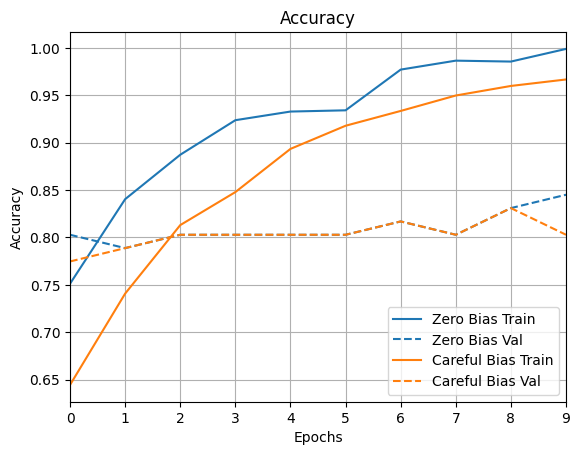

In [ ]:
plotter = tfdocs.plots.HistoryPlotter()
plotter.plot({"Zero Bias": history, "Careful Bias": model_history}, metric = "accuracy")
plt.title("Accuracy");

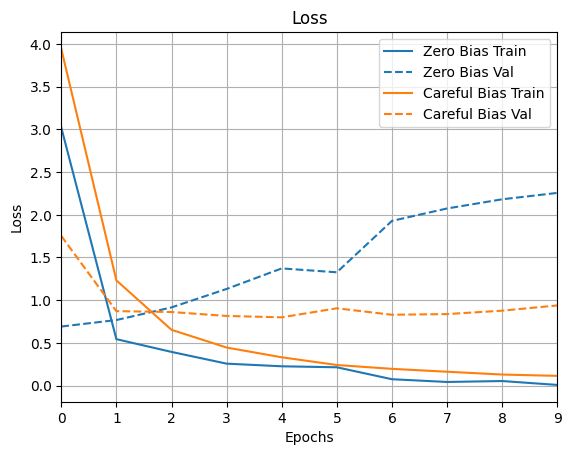

In [ ]:
plotter = tfdocs.plots.HistoryPlotter()
plotter.plot({"Zero Bias": history, "Careful Bias": model_history}, metric = "loss")
plt.title("Loss");

## Analyse and improve the model

#### 2.1 Build an input pipeline for data augmentation

Note: *`tf.keras.preprocessing.image.ImageDataGenerator` is deprecated and not recommended for new code. Instead, modern alternatives such as `tf.image` or the Keras `layers` API should be used for data augmentation. In this code, I use Keras `layers` API*.

For this task, I applied affine transformations, which are useful for generating images with a range of perturbations, including rotation, shifts, and zoom. These transformations help to increase the variety of training data, which aids in preventing overfitting and improves the model's ability to generalize to unseen data. However, I chose not to apply horizontal or vertical flipping as these transformations may not be relevant to real-life use cases in this context.

In addition to geometric transformations, I also applied changes to image color properties such as brightness and contrast, which simulate different lighting conditions and further diversify the dataset. These adjustments provide a broader range of visual scenarios to help the model handle real-world variations in the data.

To address the class imbalance in the dataset, I focused the data augmentation process only on the three minority classes, excluding the "speed limit" class, which had sufficient representation. By selectively augmenting only the underrepresented classes, I aimed to balance the training set while preventing over-augmentation of well-represented classes, which could lead to an unintended bias in the model.

In [ ]:
train_ds_aug = tf.keras.utils.image_dataset_from_directory(
    directory = new_base_dir,
    label_mode='categorical',
    validation_split = 0.3,
    subset = 'training',
    batch_size = None,
    seed = 2)

Found 877 files belonging to 4 classes.
Using 614 files for training.


In [ ]:
data_augmentation = tf.keras.Sequential(
    [tf.keras.layers.RandomRotation(0.2),
     tf.keras.layers.RandomTranslation(0.2, 0.2),
     tf.keras.layers.RandomBrightness(0.3),
     tf.keras.layers.RandomContrast(0.5),
     tf.keras.layers.RandomZoom(0.3, 0.3)])

In [ ]:
def augment_with_filter(image, label):
    # Convert label to scalar if it's one-hot encoded
    label_index = tf.argmax(label)
    label_index = tf.squeeze(label_index)

    # Ensure the condition is a scalar boolean
    condition = tf.not_equal(label_index, 1)
    condition = tf.cast(condition, tf.bool)

    # Use tf.cond to apply augmentation conditionally
    image = tf.cond(
        condition,
        lambda: data_augmentation(image),
        lambda: image
    )

    return image, label

In [ ]:
aug_ds = (
    train_ds_aug
    .map(pre_process_image, num_parallel_calls=AUTOTUNE)
    .map(augment_with_filter, num_parallel_calls=AUTOTUNE)
    .batch(32)
    .cache()
    .repeat()
    .prefetch(buffer_size=AUTOTUNE)
)

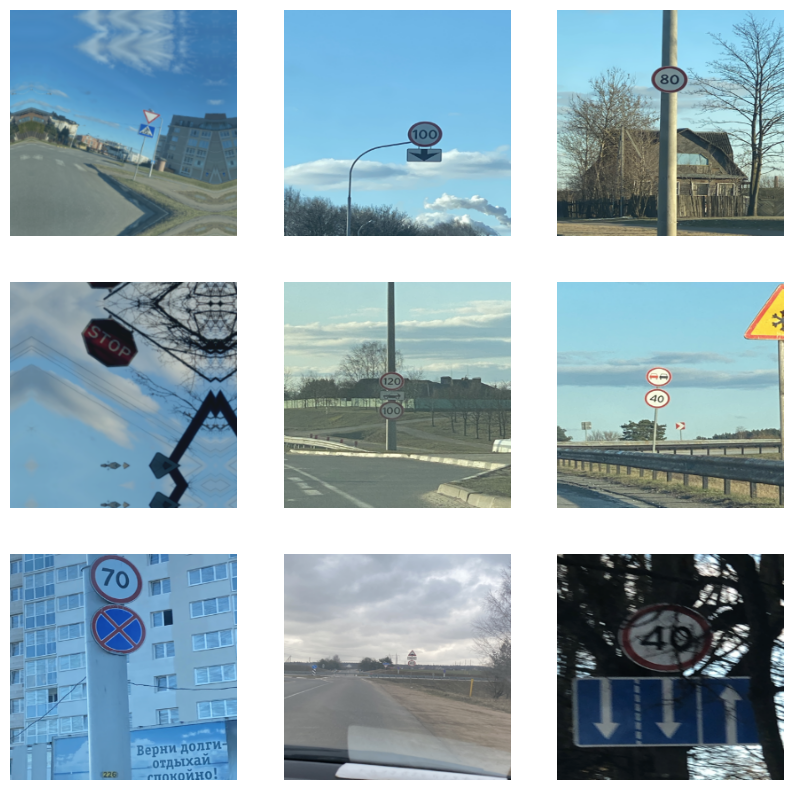

In [ ]:
for images, labels in aug_ds.take(1):
    plt.figure(figsize=(10, 10))
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.axis('off')
    plt.show()

In [ ]:
aug_model = make_model(output_bias=biases)

new_initial_lr = 1e-5
set_initial_learning_rate(aug_model, new_initial_lr)

aug_history = aug_model.fit(
      aug_ds,
      steps_per_epoch=100,
      epochs=10,
      validation_data=val_ds,
      callbacks=[
          tf.keras.callbacks.ModelCheckpoint('aug_model-{val_accuracy:.2f}.keras', monitor='val_accuracy', verbose=1, save_best_only=True, mode='max')]
      )

aug_model.save('aug_model.keras')

Epoch 1/10
 99/100 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step - ROC_AUC: 0.5136 - accuracy: 0.5970 - f1_score: 0.6056 - loss: 8.2143 - precision_1: 0.5977 - recall_1: 0.5969
Epoch 1: val_accuracy improved from -inf to 0.74648, saving model to aug_model-0.75.keras
100/100 ━━━━━━━━━━━━━━━━━━━━ 41s 277ms/step - ROC_AUC: 0.5139 - accuracy: 0.5974 - f1_score: 0.6060 - loss: 8.1725 - precision_1: 0.5981 - recall_1: 0.5973 - val_ROC_AUC: 0.6823 - val_accuracy: 0.7465 - val_f1_score: 0.6856 - val_loss: 1.4227 - val_precision_1: 0.7429 - val_recall_1: 0.7324
Epoch 2/10
 99/100 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step - ROC_AUC: 0.6384 - accuracy: 0.6498 - f1_score: 0.6667 - loss: 2.2077 - precision_1: 0.6551 - recall_1: 0.6464
Epoch 2: val_accuracy improved from 0.74648 to 0.78873, saving model to aug_model-0.79.keras
100/100 ━━━━━━━━━━━━━━━━━━━━ 19s 196ms/step - ROC_AUC: 0.6385 - accuracy: 0.6503 - f1_score: 0.6670 - loss: 2.2018 - precision_1: 0.6557 - recall_1: 0.6469 - val_ROC_AUC: 0.6827 - val_accuracy:

In [ ]:
# Evaluate the model on the new test dataset
aug_results = tf.keras.models.load_model('aug_model.keras').evaluate(test_ds)

# Print the results
print(tabulate([['Model', 'Loss', 'Accuracy', 'Precision', 'Recall', 'F1 Score', 'ROC AUC'],
                ['Augmentation + Bias Model', aug_results[0], aug_results[1], aug_results[2], aug_results[3], aug_results[4], aug_results[5]]]))

6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - ROC_AUC: 0.7595 - accuracy: 0.7400 - f1_score: 0.6962 - loss: 0.8281 - precision_1: 0.7676 - recall_1: 0.7159
-------------------------  ------------------  --------  ------------------  ------------------  ------------------  ------------------
Model                      Loss                Accuracy  Precision           Recall              F1 Score            ROC AUC
Augmentation + Bias Model  0.8695959448814392  0.71875   0.7570621371269226  0.6979166865348816  0.6682783365249634  0.7784548997879028
-------------------------  ------------------  --------  ------------------  ------------------  ------------------  ------------------


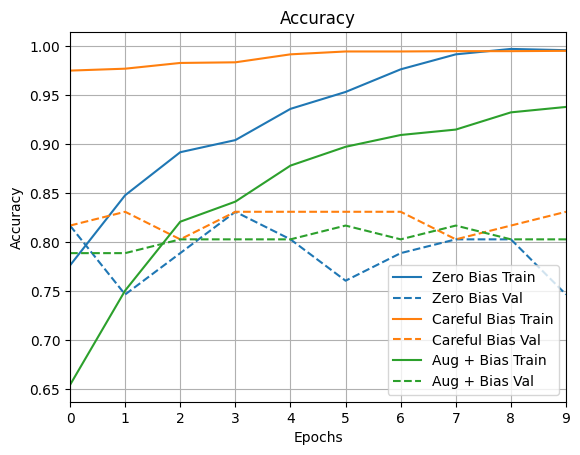

In [ ]:
plotter = tfdocs.plots.HistoryPlotter()
plotter.plot({"Zero Bias": history, "Careful Bias": model_history, "Aug + Bias": aug_history}, metric = "accuracy")
plt.title("Accuracy");

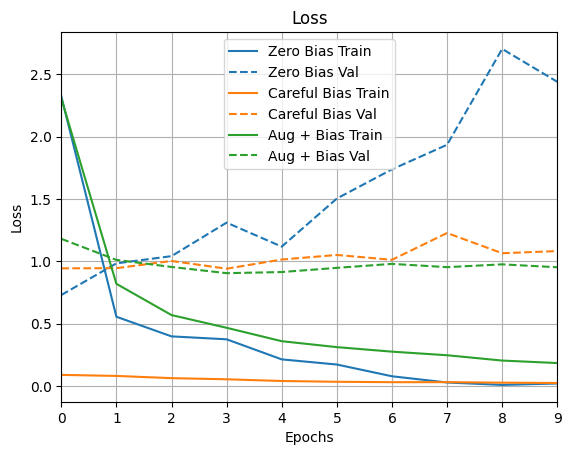

In [ ]:
plotter = tfdocs.plots.HistoryPlotter()
plotter.plot({"Zero Bias": history, "Careful Bias": model_history, "Aug + Bias": aug_history}, metric = "loss")
plt.title("Loss");

**Report the model performance with the pipeline added**

| Metric               | Base Model                       | Bias Adjusted Model             | Augmentation + Bias Model       |
|----------------------|-----------------------------------|---------------------------------|---------------------------------|
| **Accuracy**          | 79% - Strong overall accuracy | 74% - Slightly lower         | 72% - Slightly lower      |
| **Precision**         | 0.79 - High precision          | 0.74 - Slight decrease        | 0.76 - Improvement in precision |
| **Recall**            | 0.79 - Balanced with precision | 0.73 - Lower recall           | 0.70 - Slightly lower recall  |
| **F1 Score**          | 0.77 - Well balanced           | 0.68 - Precision-recall imbalance | 0.67 - Balanced but slightly lower |
| **Loss**              | 3 - High loss, overfitting   | 1 - Reduced loss           | 0.8 - Further loss reduction |
| **ROC AUC**           | 0.75 - Decent class separation | 0.8 - Better class separation | 0.78 - Balanced class separation |
| **Summary**           | Strong accuracy but high loss, good precision-recall balance | Improved class separation and lower loss, but accuracy drops due to bias focus | Lower loss and improved precision, focus on class imbalance while maintaining accuracy |

While the accuracy did not significantly increase, the **Augmentation + Bias Model** demonstrates clear improvements in **loss minimization** and a slight enhancement in class separation, as indicated by the **ROC AUC**.

The significant reduction in **loss** in the Augmented Model suggests that augmentation is effectively reducing overfitting. This means the model is learning better patterns and reducing errors on test data.

Although the **ROC AUC** is slightly lower in the **Augmentation + Bias Model** compared to the **Bias Adjusted Model**, it still shows an improvement over the **Base Model**, highlighting the model's better ability to separate the classes.

Since the **Augmentation + Bias Model** has a higher precision (0.76) compared to recall (0.70), this indicates that the model is better at **avoiding false positives**, meaning it is cautious about incorrectly predicting certain classes. However, this comes with a trade-off: the model might miss some true instances of certain classes, leading to more **false negatives**. In other words, while it reduces false positives, it does so at the cost of increasing false negatives.

Augmentation helps address class imbalance, which may lower accuracy for majority classes but improves performance on minority classes. The **lower loss** and **balanced precision/recall** suggest that the Augmentation + Bias Model is providing more equitable treatment across all classes, rather than overfitting to the majority class and artificially inflating accuracy.

**Most time-consuming operation**

Note: *Profile batch method in Tensorboard callback is [inactive](https://keras.io/api/callbacks/tensorboard/), [report issue](https://github.com/tensorflow/profiler/issues/602)*. Therefore, the Profiler tab in TensorBoard is inactive. Although there is a user-suggested solution to display the profiler, I prefer to use the alternative solution introduced by the development team because the results are more reliable.

I use PyTorch Profiler as a alternative tool to measure the time and memory consumption of the model’s operators. PyTorch includes a simple profiler API that is useful when user needs to determine the most expensive operators in the model.

In [ ]:
import torch
from torch.profiler import profile, record_function, ProfilerActivity

In [ ]:
with profile(activities=[ProfilerActivity.CPU], record_shapes=True) as prof:
    with record_function("augmentation_model_inference"):
        aug_model(torch.randn(32, 256, 256, 3))

The PyTorch profiler report shows the total CPU time spent on top 10 expensive operations. The **augmentation_model_inference** step dominates CPU usage. Other operations like random number generation contribute minimally to the overall time but might still benefit from optimization.

1. **Total CPU Time**:
   - **935.767ms** total, with the majority consumed by the **augmentation_model_inference** operation.

2. **Top Operations by CPU Time**:
   - **augmentation_model_inference**: Dominates CPU usage, taking **80.58%** (754.079ms), indicating this step is the main bottleneck.
   - **cudaLaunchKernel**: Takes **11.21%** (104.880ms), showing frequent GPU kernel launches.
   - **aten::randn** and **aten::normal_**: Contribute **2.13%** and **4.91%** respectively, likely for random tensor generation or normalization.

3. **Number of Calls**:
   - **cudaLaunchKernel** is called **593 times**, suggesting efficient GPU operations.
   - Other operations like **aten::randn** and **aten::normal_** are only called once, indicating setup or initialization tasks.

4. **CPU Time per Call**:
   - **cudaLaunchKernel** averages **176.864µs** per call, indicating low overhead.

In [ ]:
print(prof.key_averages(group_by_input_shape=True).table(sort_by="cpu_time_total", row_limit=10))

-------------------------------------------------------  ------------  ------------  ------------  ------------  ------------  ------------  ---------------------------------------------------  
                                                   Name    Self CPU %      Self CPU   CPU total %     CPU total  CPU time avg    # of Calls                                         Input Shapes  
-------------------------------------------------------  ------------  ------------  ------------  ------------  ------------  ------------  ---------------------------------------------------  
                           augmentation_model_inference        80.58%     754.079ms       100.00%     935.767ms     935.767ms             1                                                   []  
                                       cudaLaunchKernel        11.21%     104.880ms        11.21%     104.880ms     176.864us           593                                                   []  
                         

To address the slow operation related to **augmentation_model_inference**, there are some practices which is [recommended by Tensorflow](https://www.tensorflow.org/guide/profiler#best_practices_for_optimal_model_performance):

1. **Optimize the augmentation data pipeline**:
   - Augmentation operations can be offloaded to the GPU for faster execution, using GPU-compatible TensorFlow functions like those in `tf.image` and optimized input pipelines built with the `tf.data` API. This can reduce device idle time and improve overall model performance. Additionally, `tf.data.Dataset.shard` can be used for multi-GPU training, helping to distribute data more efficiently across multiple devices, further enhancing throughput.
   - To preprocess augmentations, I use the `map()` function with `num_parallel_calls=tf.data.AUTOTUNE`, which automatically determines the optimal number of parallel threads to run the augmentations across multiple CPU cores. This significantly speeds up the augmentation process by parallelizing operations, reducing CPU bottlenecks, and ensuring efficient input pipeline performance.
   - It is advice to use leverage optimized libraries or frameworks for data augmentation, such as [Albumentations](https://albumentations.ai/), which provides highly efficient augmentation techniques with lower computational overhead.
   - [Prefetching](https://www.tensorflow.org/guide/data_performance#prefetching) saves time by performing the CPU's data loading step while the GPU is training the model simultaneously.

2. **Use threading and parallel execution**:
   - Utilize the `tf.config.threading` API to run operations on multiple CPU threads for faster execution. By default, TensorFlow sets the number of parallel threads based on available CPU resources. To optimize the parallelism of a single operation, use `tf.config.threading.set_intra_op_parallelism_threads`. When multiple operations run concurrently, they share the same thread pool.

#### 2.2 Compare the performance under equal training time

I chose to compare F1 score across the training time. F1 Score is the harmonic mean of precision and recall, providing a balanced measure, especially when dataset is imbalanced. It’s useful when both false positives and false negatives are important to minimize.

Overall, I think the extra time taken is well-spent, as the model is able to see more images in different settings, from lighting, contrast, to various shifting, rotate. The time difference does show a significant disadvantage for the augmented pipeline

| Time    | Bias-adjusted Model (P task) | Augmentation Model (C task) |
|---------|------------------------------|-----------------------------|
| ~36s    | 79.66% (Epoch 3)              | 70.78% (Epoch 5)            |
| ~83s    | 92.21% (Epoch 7)              | 82.71% (Epoch 9)            |
| ~150s   | 95.57% (Epoch 10)             | 82.68% (Epoch 10)           |
| ~250s   | stopped                       | 82.68% (Epoch 10)           |

The bias-adjusted model shows rapid improvement, but this could also indicate potential overfitting to the training data. In contrast, the slower progress of the augmentation model may indicate that it is learning more robust and generalized features, which can be beneficial when applied to datasets with variations not seen during training.

#### 2.3 Identifying model strengths and weaknesses

In [ ]:
def show_prediction_grid(images, predictions, class_names, columns=3):

  rows = int(np.ceil(len(images) / columns))
  plt.figure(figsize=(15, 15))

  for i in range(len(images)):
    ax = plt.subplot(rows, columns, i + 1)
    plt.imshow(images[i].numpy().astype('uint8'))
    class_index = np.argmax(predictions[i])
    plt.title(f'Prediction: {class_names[class_index]}')
    plt.axis('off')

  plt.tight_layout()
  plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


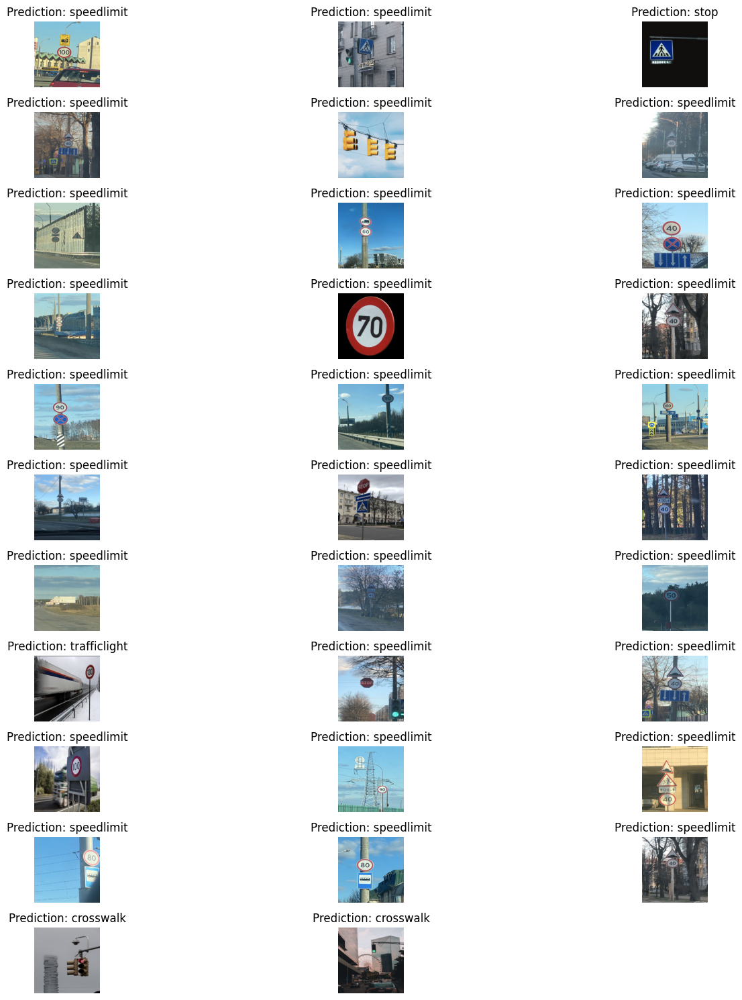

In [ ]:
for image_batch, labels_batch in test_ds.take(1):
  predictions = tf.keras.models.load_model('aug_model-0.82.keras').predict(image_batch)
  show_prediction_grid(image_batch, predictions, class_names, columns=3)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


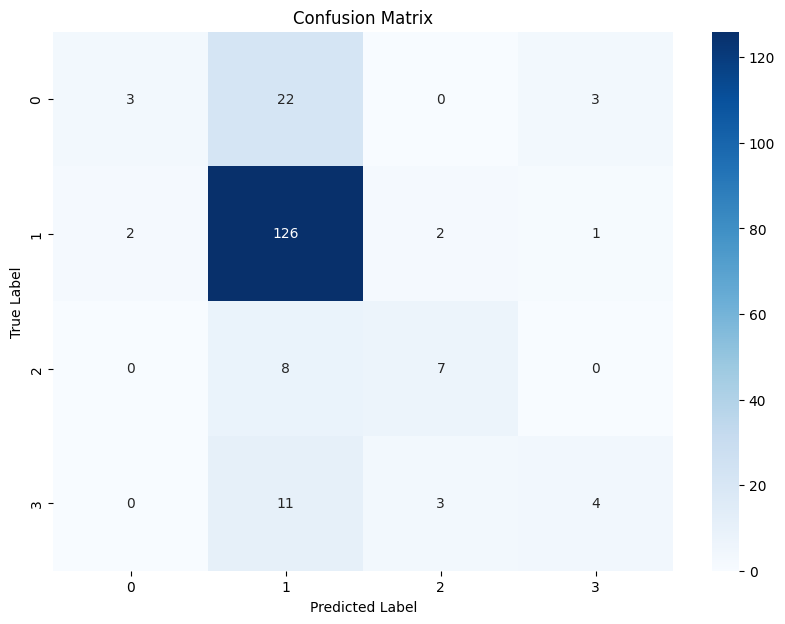

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

# Load your model
loaded_aug_model = tf.keras.models.load_model('aug_model.keras')

# Make sure the dataset is not batched, or adapt the code to handle batches
y_pred = []
y_true = []

# Iterating through the dataset
for images, labels in test_ds:
    # Get predictions
    preds = aug_model.predict(images)
    y_pred.extend(np.argmax(preds, axis=1))

    # Get true labels
    true_labels = np.argmax(labels.numpy(), axis=1)  # Make sure labels are in one-hot format
    y_true.extend(true_labels)

# Calculate confusion matrix
cm = confusion_matrix(y_true, y_pred)

# Plotting the confusion matrix
plt.figure(figsize=(10, 7))  # Adjust the figure size as necessary
sns.heatmap(cm, annot=True, cmap="Blues", fmt="d")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix");

Due to class imbalance, the "speedlimit" (class 1) causes the most confusion, with many instances of other classes (0, 2, and 3) being misclassified as class 1, resulting in a high false positive rate. Additionally, class 0 (crosswalk) and class 3 (trafficlight) exhibit high false negatives.

This could be attributed to poor dataset quality. To address this, I plan to apply stronger regularization and implement different data augmentation techniques to better manage long-tail datasets in Task D.

1. Data quality can be improved by introducing more diverse data augmentation techniques.
2. Class separation can be improved by using a weighted loss function that assigns a higher penalty for misclassifying minority or problematic classes (HD tasks).

## **Improve model generalisability across domains**

### Show sample images from the original test data and the newly collected test data.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
new_test_ds = tf.keras.utils.image_dataset_from_directory(
    directory = '/content/drive/MyDrive/newtest',
    label_mode='categorical'
    )

Found 104 files belonging to 4 classes.


The new dataste is

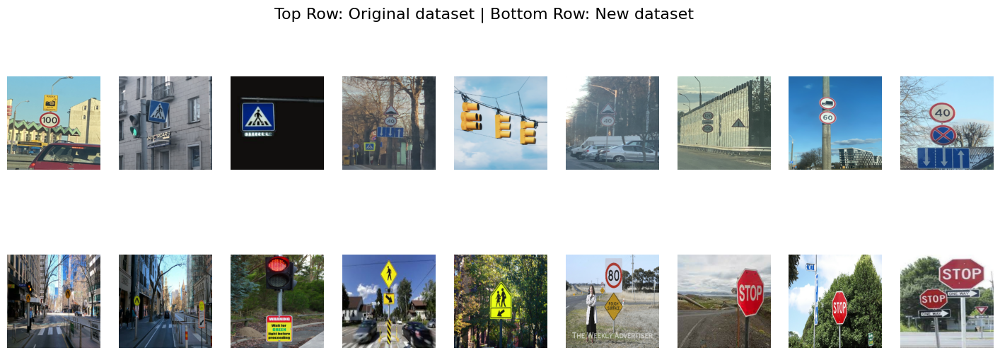

In [ ]:
# Take one batch from each dataset
for (image_batch_1, labels_batch_1), (image_batch_2, labels_batch_2) in zip(test_ds.take(1), new_test_ds.take(1)):
    # Create a figure with subplots (2 rows, 9 columns)
    plt.figure(figsize=(18, 6))

    # Add title for dataset 1
    plt.suptitle('Top Row: Original dataset | Bottom Row: New dataset', fontsize=16)

    # Plot images from the first dataset (top row)
    for i in range(9):
        ax = plt.subplot(2, 9, i + 1)  # Top row for dataset 1
        plt.imshow(image_batch_1[i].numpy().astype("uint8"))
        plt.axis('off')

    # Plot images from the second dataset (bottom row)
    for i in range(9):
        ax = plt.subplot(2, 9, i + 10)  # Bottom row for dataset 2
        plt.imshow(image_batch_2[i].numpy().astype("uint8"))
        plt.axis('off')

    # Show the plot
    plt.show()


The original dataset is online data source. It is real traffic signs but the crosswalk signs do not accurately represent those found in Australia. The new dataset, on the other hand, contains images that I either took myself or gathered from online sources within the Australian region. Therefore, the new test data provides a more accurate representation of Australian traffic signs.

The new dataset includes 104 images, which is quite balanced between classes. I think using a balanced dataset allows for a fair and comprehensive evaluation of the model’s ability to generalize across all traffic sign types, making it a more robust test of its performance.

In [ ]:
new_test_counts = count_samples_per_class(new_test_ds, class_names)

# Print the results
print(tabulate([['New Test'] + list(new_test_counts.values())],
               headers=['Dataset'] + class_names))

Dataset      crosswalk    speedlimit    stop    trafficlight
---------  -----------  ------------  ------  --------------
New Test            26            33      19              26


### Feed the new test data into your model. Report the performance change

The model did not perform well on the unseen data, as shown by the evaluation of both the bias-adjusted model and the data augmentation model. The highest accuracy achieved was 43% by the augmented model, loss is at 2.2 with a ROC AUC of 64%. This represents a 10-20% drop in performance compared to the original test set.

In [ ]:
# Evaluate the model on the new test dataset
new_base_results = model_2.evaluate(new_test_ds)
new_aug_results = aug_model.evaluate(new_test_ds)

# Print the results
print(tabulate([['Model', 'Loss', 'Accuracy', 'Precision', 'Recall', 'F1 Score', 'ROC AUC'],
                ['Base Model', new_base_results[0], new_base_results[1], new_base_results[2], new_base_results[3], new_base_results[4], new_base_results[5]],
                ['Augmented Model', new_aug_results[0], new_aug_results[1], new_aug_results[2], new_aug_results[3], new_aug_results[4], new_aug_results[5]]]))


3/3 ━━━━━━━━━━━━━━━━━━━━ 8s 2s/step - ROC_AUC: 0.5929 - accuracy: 0.2860 - f1_score: 0.2816 - loss: 5.5915 - precision_4: 0.2928 - recall_4: 0.2860
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 505ms/step - ROC_AUC: 0.6485 - accuracy: 0.4300 - f1_score: 0.3876 - loss: 2.1300 - precision_2: 0.4286 - recall_2: 0.3911
---------------  -----------------  -------------------  ------------------  -------------------  -------------------  ------------------
Model            Loss               Accuracy             Precision           Recall               F1 Score             ROC AUC
Base Model       5.799930095672607  0.2906976640224457   0.2976190447807312  0.2906976640224457   0.27245670557022095  0.6156566143035889
Augmented Model  2.170348882675171  0.43023255467414856  0.4285714328289032  0.38372093439102173  0.3868286907672882   0.6447476148605347
---------------  -----------------  -------------------  ------------------  -------------------  -------------------  ------------------


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


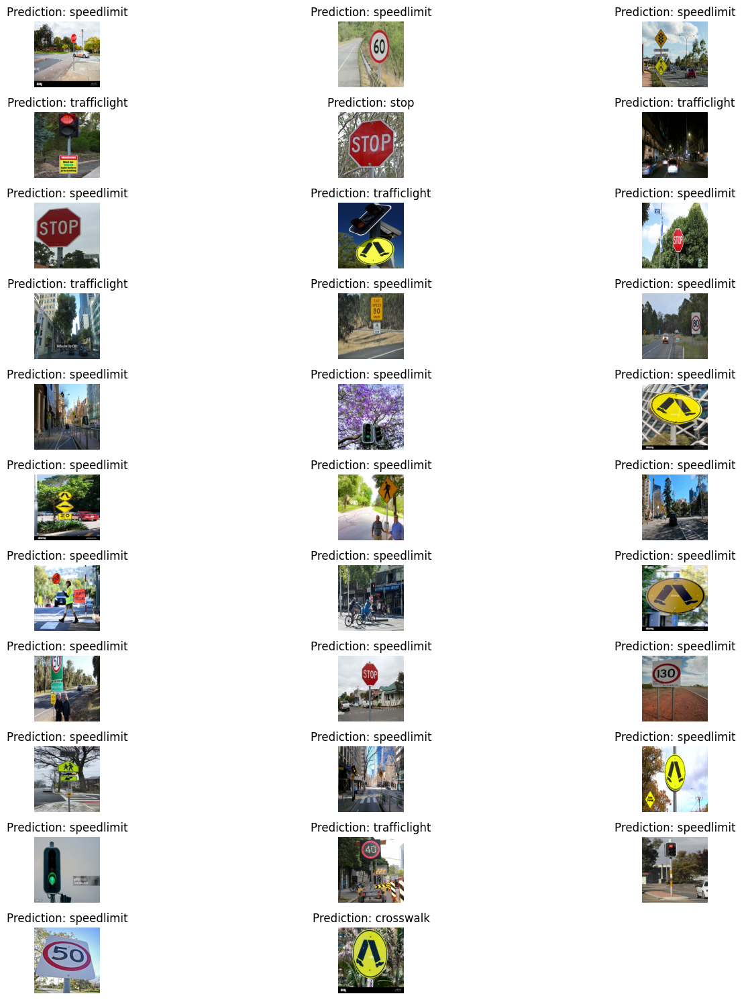

In [ ]:
for image_batch, labels_batch in new_test_ds.take(1):
  predictions = tf.keras.models.load_model('aug_model.keras').predict(image_batch)
  show_prediction_grid(image_batch, predictions, class_names, columns=3)

Plot the confusion matrix from Augmentation model to the new dataset

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


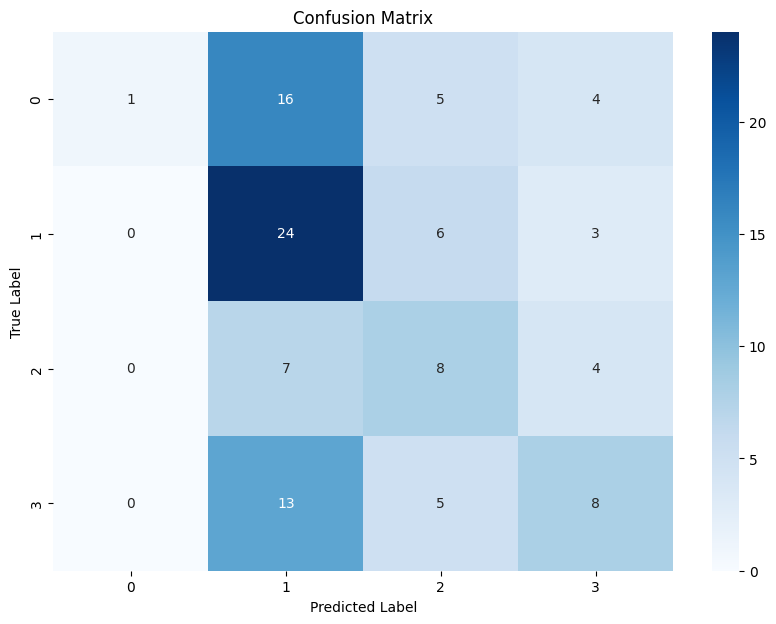

In [ ]:
y_pred = []
y_true = []

# Iterating through the dataset
for images, labels in new_test_ds:
    # Get predictions
    preds = aug_model.predict(images)
    y_pred.extend(np.argmax(preds, axis=1))

    # Get true labels
    true_labels = np.argmax(labels.numpy(), axis=1)
    y_true.extend(true_labels)

# Calculate confusion matrix
cm = confusion_matrix(y_true, y_pred)

# Plotting the confusion matrix
plt.figure(figsize=(10, 7))  # Adjust the figure size as necessary
sns.heatmap(cm, annot=True, cmap="Blues", fmt="d")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix");

### Improve your model so that it generalises better on unseen test images.

When it comes to improving model generalization, there are two main approaches:

1. Data-centric approach:
- Defining proper validation datasets: The current validation dataset already includes all the classes that are represented in the training set. I think there is no need to adjust or modify the validation dataset.
- Data augmentation: I plan to revise the augmentation techniques used during training. The current augmentations may not be sufficient to handle long-tail dataset. I will implement two specific augmentation techniques: **RandAugmentation and CutMix and Mixup**

2. Model-centric approach:
- Regularization: introduces inductive biases into the model by constraining it to a smaller, more structured subspace. This helps the model avoid overfitting and generalize better. Some common regularization techniques include:

  - Dropout (various forms): By randomly deactivating neurons during training, the model avoids relying on specific activation patterns, making it more robust to overfitting.
  - Batch normalization, layer normalization, group normalization, etc.: These techniques normalize activations across batches or layers, encouraging the model to depend on batch-wise statistics, which can stabilize and improve training.
  - L2 and L1 regularization: By penalizing models with larger L2 (Ridge) or L1 (Lasso) norms, these techniques encourage simpler models by discouraging large weights, thus reducing overfitting.
  
  Beyond these classic strategies, there are more advanced techniques that can also be interpreted as forms of regularization:

  - Multi-task learning: The model is trained to solve multiple related tasks, which forces it to learn more generalizable representations that work across different objectives.
  - Transfer learning: Initializing the model’s weights from a pre-trained model on a related task brings inductive biases from the previous task, similar to multi-task learning, and helps improve generalization.
  - Inducing geometric properties in embedding spaces: Techniques like adversarial losses, variational regularization (for autoencoders), and equivariant autoencoders enforce specific structures in latent spaces, helping the model learn robust, meaningful representations.
  - Weight matrix properties: Regularizing the structure of the model’s weight matrices, such as enforcing rotation invariance (e.g., in spherical CNNs), can leverage the data's inherent properties, reducing the number of parameters and improving generalization. For instance, CNNs and GNNs share weights to exploit spatial or graph-based invariances in the data.

- Early stopping: This technique monitors the model's performance on the validation dataset during training and stops the training process once the validation loss ceases to improve. Early stopping helps avoid overfitting by halting the training when the model starts to memorize the training data, ensuring that it retains the most generalizable state.

To build a pipeline that helps the model generalize effectively, given the imbalanced dataset, I decide to do 2 experiment with each implement diffrent technique for Augmentation (RandAugmentation and CutMix and Mixup). For the model, I keep the current Dropout (as Dropout is already [a form of adaptive L2-regularization](https://proceedings.neurips.cc/paper/2013/file/38db3aed920cf82ab059bfccbd02be6a-Paper.pdf), add Early stoping to prevent overfitting. Detail step will be explained below.

[RandAugment](https://arxiv.org/abs/1909.13719) is an automatic augmentation scheme that simplified the AutoAugment. For RandAugment the policy is just a list of augmentations with a search space limited to two parameters n and m.
where:
- `n` describes how many randomly selected augmentations should we apply to an input sample.
- `m` is a fixed magnitude used for all of the augmentations.

In [ ]:
pip -q install --upgrade keras-cv tensorflow

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 650.7/650.7 kB 22.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 950.8/950.8 kB 58.9 MB/s eta 0:00:00


In [ ]:
import keras_cv
os.environ["KERAS_BACKEND"] = "tensorflow"

In [ ]:
train_generalized_ds = tf.keras.utils.image_dataset_from_directory(
    directory = new_base_dir,
    label_mode='categorical',
    validation_split = 0.3,
    subset = 'training',
    seed = 2)

Found 877 files belonging to 4 classes.
Using 614 files for training.


In [ ]:
RandAug = tf.keras.Sequential(
  [
    keras_cv.layers.RandAugment(value_range=(0, 255), augmentations_per_image=2, magnitude=0.1, magnitude_stddev=0.1, rate=0.9),
    keras_cv.layers.Posterization(bits=4, value_range=[0, 255])
  ])

In [ ]:
def RandAug_apply(image, label):
  return RandAug(image), label

In [ ]:
RandAug_data = (
    train_generalized_ds
    .map(pre_process_image, num_parallel_calls=AUTOTUNE)
    .map(RandAug_apply, num_parallel_calls=AUTOTUNE)
    .cache()
    .repeat()
    .prefetch(buffer_size=AUTOTUNE)
  )

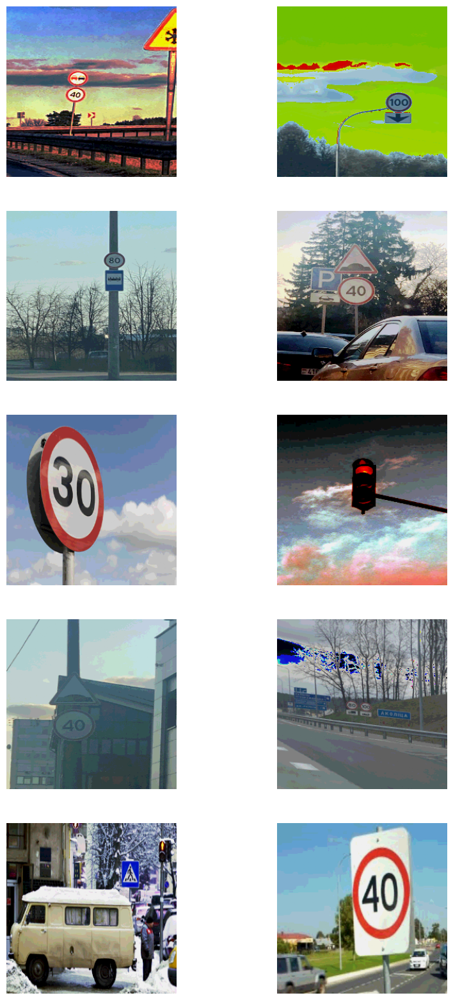

In [ ]:
# Create a larger figure to hold all subplots
plt.figure(figsize=(10, 20))

# Iterate through the first 10 images and labels in the dataset
for idx, (image, label) in enumerate(RandAug_data.take(10), start=1):
    ax = plt.subplot(5, 2, idx)  # 5 rows, 2 columns, index of the current plot
    first_image = image[0]
    ax.imshow(first_image / 255)  # Normalize pixel values if not already done
    ax.axis('off');

In [ ]:
model_generalized = make_model(output_bias=biases)

new_initial_lr = 1e-5
set_initial_learning_rate(model_generalized, new_initial_lr)

generalized_history = model_generalized.fit(
      RandAug_data,
      steps_per_epoch=100,
      epochs=20,
      validation_data=val_ds,
      callbacks=[
          tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=3, verbose=1, restore_best_weights=True),
          tf.keras.callbacks.ModelCheckpoint('model_generalized-{val_accuracy:.2f}.keras', monitor='val_accuracy', verbose=1, save_best_only=True, mode='max')]
      )

model_generalized.save('model_generalized.keras')

Epoch 1/20
 99/100 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - ROC_AUC: 0.5209 - accuracy: 0.5488 - f1_score: 0.5615 - loss: 7.1458 - precision_10: 0.5511 - recall_10: 0.5474
Epoch 1: val_accuracy improved from -inf to 0.78873, saving model to model_generalized-0.79.keras
100/100 ━━━━━━━━━━━━━━━━━━━━ 20s 137ms/step - ROC_AUC: 0.5215 - accuracy: 0.5501 - f1_score: 0.5627 - loss: 7.0908 - precision_10: 0.5525 - recall_10: 0.5487 - val_ROC_AUC: 0.6212 - val_accuracy: 0.7887 - val_f1_score: 0.7171 - val_loss: 1.6511 - val_precision_10: 0.8000 - val_recall_10: 0.7887
Epoch 2/20
 99/100 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - ROC_AUC: 0.6546 - accuracy: 0.6750 - f1_score: 0.6657 - loss: 1.5155 - precision_10: 0.6844 - recall_10: 0.6648
Epoch 2: val_accuracy did not improve from 0.78873
100/100 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - ROC_AUC: 0.6552 - accuracy: 0.6753 - f1_score: 0.6660 - loss: 1.5110 - precision_10: 0.6848 - recall_10: 0.6651 - val_ROC_AUC: 0.6685 - val_accuracy: 0.7746 - val_f1_score: 0.7

In [ ]:
# Evaluate the model on the new test dataset
RandAug_test_results = model_generalized.evaluate(test_ds)
RandAug_new_test_results = model_generalized.evaluate(new_test_ds)

# Print the results
print(tabulate([['Model', 'Loss', 'Accuracy', 'Precision', 'Recall', 'F1 Score', 'ROC AUC'],
                ['Test set', RandAug_test_results[0], RandAug_test_results[1], RandAug_test_results[2], RandAug_test_results[3], RandAug_test_results[4], RandAug_test_results[5]],
                ['New Test set', RandAug_new_test_results[0], RandAug_new_test_results[1], RandAug_new_test_results[2], RandAug_new_test_results[3], RandAug_new_test_results[4], RandAug_new_test_results[5]]]))

6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - ROC_AUC: 0.6741 - accuracy: 0.7269 - f1_score: 0.6519 - loss: 0.9561 - precision_5: 0.7325 - recall_5: 0.7122
3/3 ━━━━━━━━━━━━━━━━━━━━ 3s 1s/step - ROC_AUC: 0.4932 - accuracy: 0.3403 - f1_score: 0.2528 - loss: 2.5720 - precision_5: 0.3353 - recall_5: 0.3150   
------------  ------------------  -------------------  ------------------  ------------------  -------------------  ------------------
Model         Loss                Accuracy             Precision           Recall              F1 Score             ROC AUC
Test set      0.9791645407676697  0.7135416865348816   0.7204301357269287  0.6979166865348816  0.6239290237426758   0.7183196544647217
New Test set  2.396066904067993   0.38372093439102173  0.375               0.3488371968269348  0.27301743626594543  0.4933405816555023
------------  ------------------  -------------------  ------------------  ------------------  -------------------  ------------------


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


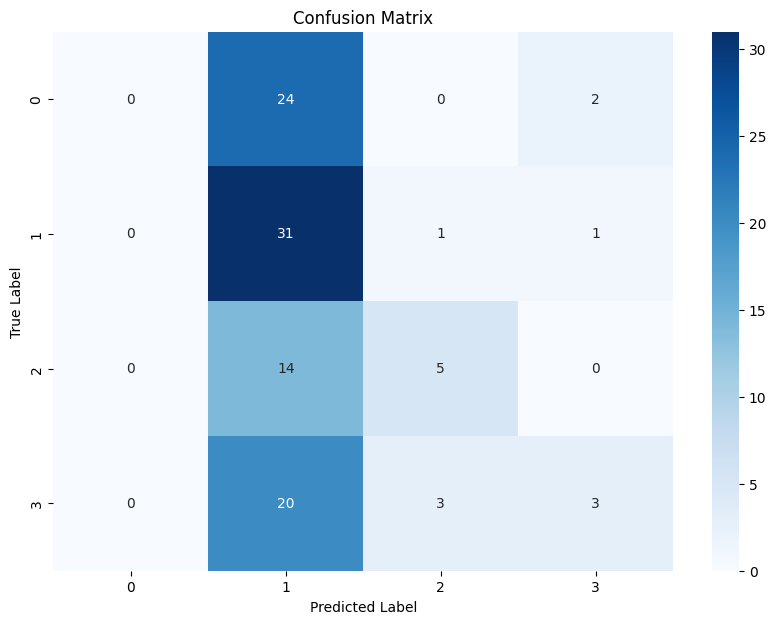

In [ ]:
# Make sure the dataset is not batched, or adapt the code to handle batches
y_pred = []
y_true = []

# Iterating through the dataset
for images, labels in new_test_ds:
    # Get predictions
    preds = model_generalized.predict(images)
    y_pred.extend(np.argmax(preds, axis=1))

    # Get true labels
    true_labels = np.argmax(labels.numpy(), axis=1)  # Make sure labels are in one-hot format
    y_true.extend(true_labels)

# Calculate confusion matrix
cm = confusion_matrix(y_true, y_pred)

# Plotting the confusion matrix
plt.figure(figsize=(10, 7))
sns.heatmap(cm, annot=True, cmap="Blues", fmt="d")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix");

[`CutMix`](https://arxiv.org/abs/1905.04899) and [`MixUp`](https://arxiv.org/abs/1710.09412) allow us to produce inter-class examples. `CutMix` randomly cuts out portions of one image and places them over another, while `MixUp` interpolates the pixel values between two images. They create hybrid images by blending or cutting and mixing portions of two different images and their labels. This helps minority classes appear more frequently to the model, preventing it from overfitting to the training distribution and improving the likelihood that the model can generalize to out-of-distribution examples. Additionally, `CutMix` prevents the model from over-relying on any particular feature to make its classifications.

In [ ]:
CutMix = tf.keras.Sequential([
    keras_cv.layers.CutMix(),
    keras_cv.layers.MixUp(alpha = 0.1)
])

In [ ]:
def apply_cutmix(images, labels):
    data_dict = {"images": images, "labels": labels}
    CutMix_dict = CutMix(data_dict)
    return CutMix_dict["images"], CutMix_dict["labels"]

In [ ]:
CutMix_ds = (
    train_generalized_ds
    .map(pre_process_image, num_parallel_calls=AUTOTUNE)
    .map(apply_cutmix, num_parallel_calls=AUTOTUNE)
    .cache()
    .repeat()
    .prefetch(buffer_size=AUTOTUNE))

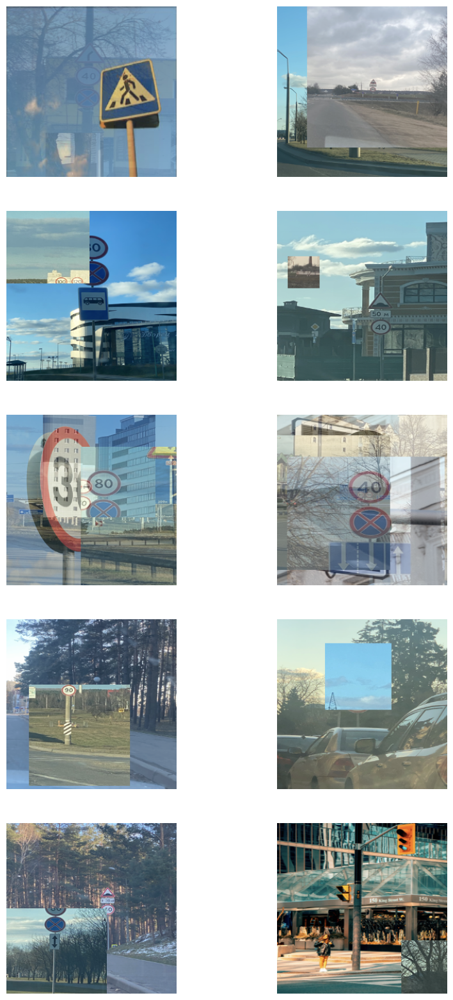

In [ ]:
plt.figure(figsize=(10, 20))

# Iterate through the first 10 images and labels in the dataset
for idx, (image, label) in enumerate(CutMix_ds.take(10), start=1):
    ax = plt.subplot(5, 2, idx)  # 5 rows, 2 columns, index of the current plot
    first_image = image[0]
    ax.imshow(first_image / 255)  # Normalize pixel values if not already done
    ax.axis('off');

In [ ]:
model_cutmix = make_model(output_bias=biases)

new_initial_lr = 1e-5
set_initial_learning_rate(model_cutmix, new_initial_lr)

cutmix_history = model_cutmix.fit(
      CutMix_ds,
      steps_per_epoch=100,
      epochs=20,
      validation_data=val_ds,
      callbacks=[
          tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=3, verbose=1, restore_best_weights=True),
          tf.keras.callbacks.ModelCheckpoint('model_cutmix-{val_accuracy:.2f}.keras', monitor='val_accuracy', verbose=1, save_best_only=True, mode='max')]
      )

model_cutmix.save('model_cutmix.keras')

Epoch 1/20
 99/100 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - ROC_AUC: 0.5716 - accuracy: 0.6630 - f1_score: 0.5627 - loss: 6.8312 - precision_12: 0.9204 - recall_12: 0.4328
Epoch 1: val_accuracy improved from -inf to 0.64789, saving model to model_cutmix-0.65.keras
100/100 ━━━━━━━━━━━━━━━━━━━━ 17s 116ms/step - ROC_AUC: 0.5717 - accuracy: 0.6642 - f1_score: 0.5636 - loss: 6.7437 - precision_12: 0.9215 - recall_12: 0.4336 - val_ROC_AUC: 0.6589 - val_accuracy: 0.6479 - val_f1_score: 0.6228 - val_loss: 1.2239 - val_precision_12: 0.6618 - val_recall_12: 0.6338
Epoch 2/20
 99/100 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - ROC_AUC: 0.6543 - accuracy: 0.7728 - f1_score: 0.6812 - loss: 0.7936 - precision_12: 0.9881 - recall_12: 0.5138
Epoch 2: val_accuracy improved from 0.64789 to 0.78873, saving model to model_cutmix-0.79.keras
100/100 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - ROC_AUC: 0.6546 - accuracy: 0.7730 - f1_score: 0.6815 - loss: 0.7927 - precision_12: 0.9882 - recall_12: 0.5138 - val_ROC_AUC: 0.7700 - v

CutMix and MixUp have definitely helped the model generalize better. The accuracy has shown a slight improvement, and by examining the confusion matrix, we can see that the model is correctly predicting a broader range of labels.

In [ ]:
# Evaluate the model on the new test dataset
CutMix_test_results = model_cutmix.evaluate(test_ds)
CutMix_new_test_results = model_cutmix.evaluate(new_test_ds)

# Print the results
print(tabulate([['Model', 'Loss', 'Accuracy', 'Precision', 'Recall', 'F1 Score', 'ROC AUC'],
                ['Test set', CutMix_test_results[0], CutMix_test_results[1], CutMix_test_results[2], CutMix_test_results[3], CutMix_test_results[4], CutMix_test_results[5]],
                ['New Test set', CutMix_new_test_results[0], CutMix_new_test_results[1], CutMix_new_test_results[2], CutMix_new_test_results[3], CutMix_new_test_results[4], CutMix_new_test_results[5]]]))

6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - ROC_AUC: 0.7213 - accuracy: 0.7435 - f1_score: 0.6725 - loss: 0.7615 - precision_12: 0.7829 - recall_12: 0.7163
3/3 ━━━━━━━━━━━━━━━━━━━━ 3s 490ms/step - ROC_AUC: 0.6111 - accuracy: 0.4006 - f1_score: 0.2945 - loss: 2.6979 - precision_12: 0.3896 - recall_12: 0.3209
------------  ------------------  -------------------  ------------------  ------------------  -------------------  ------------------
Model         Loss                Accuracy             Precision           Recall              F1 Score             ROC AUC
Test set      0.7926016449928284  0.734375             0.7683615684509277  0.7083333134651184  0.6601590514183044   0.7621383666992188
New Test set  2.3405182361602783  0.44186046719551086  0.4202898442745209  0.3372093141078949  0.32712429761886597  0.6164224147796631
------------  ------------------  -------------------  ------------------  ------------------  -------------------  ------------------


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


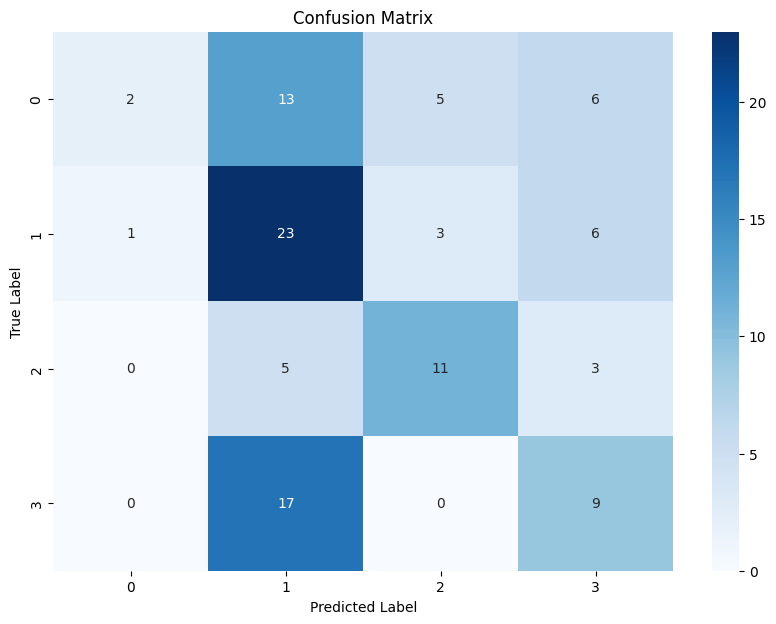

In [ ]:
y_pred = []
y_true = []

# Iterating through the dataset
for images, labels in new_test_ds:
    # Get predictions
    preds = tf.keras.models.load_model('/content/drive/MyDrive/sit744a2/model_cutmix.keras').predict(images)
    y_pred.extend(np.argmax(preds, axis=1))

    # Get true labels
    true_labels = np.argmax(labels.numpy(), axis=1)
    y_true.extend(true_labels)

# Calculate confusion matrix
cm = confusion_matrix(y_true, y_pred)

# Plotting the confusion matrix
plt.figure(figsize=(10, 7))  # Adjust the figure size as necessary
sns.heatmap(cm, annot=True, cmap="Blues", fmt="d")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix");

In [ ]:
!cp *.keras /content/drive/MyDrive/newa2model

## **Improving the Generalisation of the Model**

#### 4.1 Study paper

**1.1 What problem does the paper address?**

The paper addresses the problem of improving the generalization ability of deep neural networks (DNNs), particularly for those networks that are highly parametrized, containing typically millions or even billions of parameters, which typically far outweighs the number of training samples. While the use of such numbers of parameters normally means DNNs can provide better solutions in a larger hypothesis space. But in the meantime, such a huge hypothesis space is also full of more minima with diverse generalization ability (Neyshabur et al., 2017). This makes it more challenging to train them to converge to optimal minima at which models would generalize better.

The authors propose a method to improve generalization by penalizing the gradient norm of the loss function during training. This technique aims to lead the optimizer toward finding "flat minima," which are associated with better generalization than "sharp minima".

**1.2 How is it related to what you have learnt in the unit so far?**

The problem addressed in the paper is closely related to key concepts from generalization of deep neural networks (DNNs) that we have learnt in the unit.
   - The problem of improving the generalization ability of DNNs, especially those with a large number of parameters, is central to preventing overfitting. Overfitting occurs when a model performs well on the training data but fails to generalize to unseen data.
   - The idea of guiding the optimizer toward "flat minima" instead of "sharp minima" relates to the shape of the loss landscape. In learning about optimization techniques like gradient descent, I've seen how the path an optimizer takes influences the quality of the minima.
   - The paper’s focus on finding better generalization solutions directly ties into the bias-variance trade-off. By penalizing the gradient norm, the method seeks to reduce variance (overfitting) without increasing bias (underfitting), which is a key aspect of training DNNs efficiently.

**2.1 What approach did they take? What prior results lead to this approach?**

The authors' approach builds on previous work that identified flat minima as desirable for generalization (Hochreiter & Schmidhuber, 1997). This idea says flat minima, large, connected regions in weight space where the error remains approximately constant, have been demonstrated to lead to better generalization ability of DNNs. By adding a penalty term to the loss function which is proportional to the gradient p-norm, it is argued that the optimizer is driven to find such flat minima, thereby improving the generalization ability of the model. The addition of such a penalty term can be seen as a generalization of the Sharpness Aware Minimization (SAM) approach (Foret, Kleiner, Mobahi, & Neyshabur, 2021), where hyperparameters have been decoupled to provide a more flexible optimization strategy.

The authors give their approach by develop a loss function, given a training dataset $ \mathcal{S} = \left\{(x_i, y_i)\right\}_{i=0}^{N} $ composed of training data $ x_i $ and training labels $ y_i $ drawn i.i.d from an underlying distribution, a neural network $ f(\cdot; \theta) $ is trained to learn this distribution by minimizing the loss function
$$ L(\theta) = L_S(\theta) + \lambda \|\nabla_\theta L_S(\theta)\|_p $$
 Here,
 - $ \|\ . \|_p $ denotes the $ L_p \text{-norm} $,
 - $ \lambda \in \mathbb{R}^+ $ is the penalty coefficient,
 - $ \theta $ denotes the parameters (weights) in weight space $ \Theta $,
 - $ L_S(\theta) = \frac{1}{N} \sum_{i=0}^{N} l(\hat{y}_i, y_i, \theta) $ is an empirical loss function (e.g. cross-entropy), where $ \hat{y}_i = f(x_i; \theta) $ denotes the predicted label for input $ x_i $.

By considering the notion of a Lipschitz continuous function on a subset of $\mathbb{R}^n $ , with the $ L_2 \text{-norm} $ (p=2), it can be shown that small Lipschitz constants correspond to flat minima, leading to better generalization of the neural network. Given $ \Omega \subset \mathbb{R}^n $, a function $ \quad h: \Omega \to \mathbb{R}^m $ is said to be Lipschitz continuous if there exists a constant $ K $ such that: $$ \left\| h(\theta_1) - h(\theta_2) \right\|_2 \leq K \left\| \theta_1 - \theta_2 \right\|_2 $$
for all $ \theta_1 $, $ \theta_2 \in \Omega $. The Lipschitz constant typically refers to the smallest possible choice of the constant $ K $. Additionally, for all $ \theta \in \Omega $, the function $ h $ is said to be locally Lipschitz continuous if $ \theta $ has a neighbourhood $ A $ such that the restriction of $ h $ to $ A ($ $ h|_A $), is Lipschitz continuous. Suppose the minimum $ \theta_i $ exist, according to the mean value theorem and the Cauchy-Schwarz inequality, for all $ \theta_i' \in A $, authors derrives
$$ \left\| L(\theta_i') - L(\theta_i) \right\|_2 = \left\| \nabla L(\zeta) (\theta_i' - \theta_i) \right\|_2
\leq \left\| \nabla L(\zeta) \right\|_2 \left\| \theta_i' - \theta_i \right\|_2 $$

where:
- $ \zeta = c \theta_i + (1 - c) \theta_i', \quad c \in [0, 1] $

As $ θ'_i -> θ_i $, the Lipschitz constant approaches $ \left\| \nabla L(\theta_i) \right\|_2 $. This motivates minimizing $ \left\| \nabla L(\theta_i) \right\|_2 $ to give small Lipschitz constants such that the DNN converges to a flat minima (Zhao, Zhang, & Hu, 2022). This can be achieved during training by calculating the gradient of the loss function. $$ \nabla_\theta L(\theta) = \nabla_\theta L_S(\theta) + \nabla_\theta \left( \lambda \left\| \nabla_\theta L_S(\theta) \right\|_2 \right) $$

From now on, **the subscript “2” on the norm** will be omitted. By invoking the chain rule, the above can be written as:
$$ \nabla_\theta L(\theta) = \nabla_\theta L_S(\theta) + \lambda \frac{\nabla^2_\theta L_S(\theta) \nabla_\theta L_S(\theta)}{\left\| \nabla_\theta L_S(\theta) \right\|} $$

To avoid computationally expensive second-order derivatives (such as the Hessian), the authors use a first-order approximation to compute the gradient norm penalty efficiently, making the method feasible in practical settings:
$$ \nabla_\theta L_S(\theta + \Delta \theta) = \nabla_\theta L_S(\theta) + H \Delta \theta + \mathcal{O} \left( \| \Delta \theta \|^2 \right) $$

By Choosing $ \Delta \theta = r v $, $ \quad v = \frac{\nabla_\theta L_S(\theta)}{\|\nabla_\theta L_S(\theta)\|} $ where $ v $ is normalized by the gradient of the loss,  and ignoring terms of  $ O(r) $ this yields the approximation
$$ H \frac{\nabla_\theta L_S(\theta)}{\|\nabla_\theta L_S(\theta)\|}
\approx \frac{\nabla_\theta L_S \left( \theta + r \frac{\nabla_\theta L_S(\theta)}{\|\nabla_\theta L_S(\theta)\|} \right) - \nabla_\theta L_S(\theta)}{r} $$
This means the gradient of the loss function can be written as
$$ \nabla_\theta L(\theta) = (1 - \alpha) \nabla_\theta L_S(\theta) + \alpha \nabla_\theta L_S\left(\theta + r \frac{\nabla_\theta L_S(\theta)}{\|\nabla_\theta L_S(\theta)\|}\right) $$
where $ \alpha = \frac{\lambda}{r} $ is the balance coefficient. As discussed in (Zhao, Zhang, & Hu, 2022), the constant r should be small enough so that the error term $ O(r) $ can be safely ignored in the approximation, but should be large enough to provide enough of precision of $ v $. In practice, to avoid having to compute the Hessian matrix, the following approximation is made
$$ \nabla_{\theta} L_S \left( \theta + \frac{\nabla_{\theta} L_S(\theta)}{\|\nabla_{\theta} L_S(\theta)\|} \right)
\approx \nabla_{\theta} L_S(\theta + \frac{\nabla_{\theta} L_S(\theta)}{\|\nabla_{\theta} L_S(\theta)\|}) $$
This leads to the optimization scheme summarised in algorithm 1 in the paper. Note that algorithm 1 is only applicable when a stochastic gradient decent (SGD) optimizer is used. The use of alternative optimizers/update strategies, such as Adam, would require additional operations before step 8.

**3. How do the authors validate their proposed method or hypothesis?**

The optimization scheme presented in Algorithm 1 above is validated by (Zhao, Zhang, & Hu, 2022) through investigating performance on image classification tasks. This is done by comparing algorithm 1 with a standard training scheme using a SGD optimizer and the SAM training scheme for a) the CIFAR-10 and CIFAR-100 datasets and b) the ImageNet dataset. The use of these datasets allows (Zhao, Zhang, & Hu, 2022) to validate the robustness of their proposed method across different scales, in terms of the number of samples, and complexity. In the case of the CIFAR datasets, several different convolutional neural network (CNN) architectures are tested; VGG16 with and without batch normalization (Simonyan & Zisserman, 2015), WideResNet-28-10 with and without Shake-Shake regularization (Gastaldi, 2017), and PyramidNet-270 with Shake-Drop regularization (Yamada, Iwamura, Akiba, & Kise, 2019). The impact of algorithm 1 on the vision transformer architectures ViT-T116 and ViT-S16 (Dosovitskiy, et al., 2021) is also investigated for these datasets. In order to reduce tuning cost during implementation, a ‘greedy’ strategy is employed for testing the CIFAR datasets. From (Zhao, Zhang, & Hu, 2022).

1. The first train models uses the standard training scheme (λ = 0 in the scheme) and record the common training hyperparameters (such as learning rate, weight decay) that could give the best model performance.
2. Based on the best hyperparameters recorded in Step 1, then set the balance coefficient α = 1 to train the same models using the SAM scheme, and perform a grid search on the parameter r.
3. Finally, based on the previous information, they further perform a grid search on the balance coefficient α to adjust the penalty coefficient.
Furthermore, a parameter study is conducted on the WideResNet28-10 architecture, investigating how different balance coefficients and approximation scalars, r, affect the performance of the optimization scheme presented in algorithm 1.
In the case of the ImageNet dataset, the VGG16 architecture with batch normalisation, ResNet50 and ResNet101 architectures are used to evaluate the effectiveness of the optimization scheme on a large-scale dataset, with comparison to a standard training scheme using a SGD optimizer and the SAM scheme.
4. They found the best parameter for $ α $ is 0.8 and $ r ∈ $ {0.05, 0.1}.

**4. Are the reported experimental results fully consistent with the paper's claims? Why/Why not?**

The experimental results presented in (Zhao, Zhang, & Hu, 2022) consistently support the authors' claims that the proposed gradient norm penalty method outperforms both standard training and Sharpness-Aware Minimization (SAM) across various datasets and architectures. The method shows particularly strong improvements on complex CNN architectures like WideResNet and PyramidNet, achieving up to 70% greater improvement over SAM, especially on CIFAR-10 and CIFAR-100. On larger datasets like ImageNet, the method provides more modest yet consistent gains, demonstrating scalability. While there are some cases where standard training performs better, particularly with specific augmentations on CIFAR-100, the authors attribute these exceptions to the interactions between the augmentations and the penalty. Overall, the method improves generalization in a broad range of settings, with stable training dynamics and significant performance gains, especially for deeper architectures​

#### 4.2 Empirical validation of the results


I use the augmentation on original dataset, this dataset haven't had good generalization (only 43% and 44% with the best augmentation technique) on the new test dataset.

In [ ]:
@tf.keras.utils.register_keras_serializable()
class CustomModel(tf.keras.Model):
    def __init__(self, *args, r, alpha, **kwargs):
        super().__init__(*args, **kwargs)
        self.r = r
        self.alpha = alpha

    def train_step(self, data):
        x, y = data #Getting batch data paris B

        # Compute initial predictions and loss
        with tf.GradientTape() as tape:
            y_pred = self(x, training=True)
            loss = self.compute_loss(x, y, y_pred, sample_weight=None)

        # Compute gradients g1
        grads = tape.gradient(loss, self.trainable_variables)

        # Compute gradient norm and normalize gradients
        grad_norm = tf.sqrt(tf.add_n([tf.reduce_sum(tf.square(g)) for g in grads])) + 1e-8 #Adding epsilon to avoid deviding for 0
        normalized_grads = [g / grad_norm for g in grads]

        # Save original weights
        original_weights = [tf.identity(w) for w in self.trainable_variables]

        # Modify parameters to obtain θ_t'
        temp_weights = [w + self.r * ng for w, ng in zip(self.trainable_variables, normalized_grads)]
        for var, temp_w in zip(self.trainable_variables, temp_weights):
            var.assign(temp_w)

        # Compute predictions and loss at θ_t'
        with tf.GradientTape() as tape2:
            y_pred2 = self(x, training=True)
            loss2 = self.compute_loss(x, y, y_pred2, sample_weight=None)

        # Compute gradients g2 at θ_t'
        grads2 = tape2.gradient(loss2, self.trainable_variables)

        # Restore original weights
        for var, orig_w in zip(self.trainable_variables, original_weights):
            var.assign(orig_w)

        # Compute final gradient g
        final_grads = [(1 - self.alpha) * g1 + self.alpha * g2 for g1, g2 in zip(grads, grads2)]

        # Apply gradients to update parameters
        self.optimizer.apply_gradients(zip(final_grads, self.trainable_variables))

        # Update metrics
        for metric in self.metrics:
            metric.update_state(y, y_pred)

        # Return a dict mapping metric names to current values
        return {m.name: m.result() for m in self.metrics}

    def test_step(self, data):
        x, y = data
        y_pred = self(x, training=False)
        loss = self.compute_loss(x, y, y_pred, sample_weight=None)

        # Update metrics
        for metric in self.metrics:
            metric.update_state(y, y_pred)

        # Return a dict mapping metric names to current values
        return {m.name: m.result() for m in self.metrics}

In the paper, the authors used SGD as the optimizer. Therefore, I need to define another CNN model that maintains the architecture of the base model but separates the compiler from the neural network.

I also added L2 regularization, as its combined effects can potentially improve model performance in the following ways:

- L2 regularization penalizes large weights by adding a term proportional to the square of the weights' magnitude to the loss function. This discourages overfitting by pushing weights towards smaller values, helping the model generalize better.
- Additionally, following the method from the paper, I further penalize the gradient norm of the loss function during optimization. This encourages smoother updates and can lead to improved convergence and robustness, particularly when training with noisy or complex data.

In [ ]:
def make_model_2(output_bias=None):
    # Set the output layer's bias to reflect class imbalance
    if output_bias is not None:
        output_bias = tf.keras.initializers.Constant(output_bias)

    inputs = tf.keras.Input(shape=(256, 256, 3))

    # Convolutional base
    x = tf.keras.layers.Conv2D(32, (3, 3), activation='relu')(inputs)
    x = tf.keras.layers.MaxPooling2D(2, 2)(x)

    x = tf.keras.layers.Conv2D(64, (3, 3), activation='relu')(x)
    x = tf.keras.layers.MaxPooling2D(2, 2)(x)

    x = tf.keras.layers.Conv2D(128, (3, 3), activation='relu')(x)
    x = tf.keras.layers.MaxPooling2D(2, 2)(x)

    x = tf.keras.layers.Conv2D(256, (3, 3), activation='relu')(x)
    x = tf.keras.layers.MaxPooling2D(2, 2)(x)

    x = tf.keras.layers.Conv2D(256, (3, 3), activation='relu')(x)
    x = tf.keras.layers.MaxPooling2D(2, 2)(x)

    # Dense head
    x = tf.keras.layers.Flatten()(x)
    x = tf.keras.layers.Dense(512, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.01))(x)
    x = tf.keras.layers.Dropout(0.5)(x)

    # Output layer with 4 classes, softmax activation, and bias initializer
    outputs = tf.keras.layers.Dense(4, activation='softmax', bias_initializer=output_bias)(x)

    model = tf.keras.Model(inputs=inputs, outputs=outputs)
    return model


In [ ]:
# Create and compile the model
model_penalty_base = make_model_2(output_bias=biases)
model_penalty = CustomModel(inputs=model_penalty_base.input, outputs=model_penalty_base.output, r=0.05, alpha=0.8)

I also change the learning rate to be higher than base model, because the author specifically states that small learning rate may not lead to the best performance. Therefore I return it to 0.001 which is a default learning rate of some common optimizers.

In [ ]:
model_penalty.compile(
    optimizer=tf.keras.optimizers.SGD(learning_rate=1e-3),
    loss='categorical_crossentropy',
    metrics=[
        tf.keras.metrics.CategoricalAccuracy(name='accuracy'),
        tf.keras.metrics.Precision(),
        tf.keras.metrics.Recall(),
        tf.keras.metrics.F1Score(average='weighted', threshold=0.3),
        # AUC for multi-class classification
        tf.keras.metrics.AUC(multi_label=True, num_labels=4, curve='ROC', name='ROC_AUC')
    ]
)

In [ ]:
# Train the model
penalty_history = model_penalty.fit(
    aug_ds,
    steps_per_epoch=150,
    epochs=20,
    validation_data=val_ds,
    callbacks=[
        tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', patience=3, verbose=1, restore_best_weights=True),
        tf.keras.callbacks.ModelCheckpoint('model_penalty_2-{val_accuracy:.2f}.keras', monitor='val_accuracy', verbose=1, save_best_only=True, mode='max')
    ]
)

# Save the trained model
model_penalty.save('model_penalty_2.keras')


Epoch 1/20
150/150 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step - ROC_AUC: 0.5503 - accuracy: 0.7390 - f1_score: 0.6584 - precision_13: 0.7442 - recall_13: 0.7323 - loss: 0.6087
Epoch 1: val_accuracy improved from -inf to 0.76056, saving model to model_penalty_2-0.76.keras
150/150 ━━━━━━━━━━━━━━━━━━━━ 44s 252ms/step - ROC_AUC: 0.5508 - accuracy: 0.7392 - f1_score: 0.6585 - precision_13: 0.7443 - recall_13: 0.7324 - loss: 0.6087 - val_ROC_AUC: 0.6880 - val_accuracy: 0.7606 - val_f1_score: 0.6571 - val_loss: 0.6306 - val_precision_13: 0.7714 - val_recall_13: 0.7606
Epoch 2/20
150/150 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step - ROC_AUC: 0.7956 - accuracy: 0.7733 - f1_score: 0.6984 - precision_13: 0.7895 - recall_13: 0.7578 - loss: 0.6204
Epoch 2: val_accuracy improved from 0.76056 to 0.80282, saving model to model_penalty_2-0.80.keras
150/150 ━━━━━━━━━━━━━━━━━━━━ 33s 219ms/step - ROC_AUC: 0.7956 - accuracy: 0.7734 - f1_score: 0.6986 - precision_13: 0.7896 - recall_13: 0.7578 - loss: 0.6205 - val_ROC_AUC: 

In [ ]:
# Evaluate the model on the new test dataset
penalty_test_results_2 = model_penalty.evaluate(test_ds)
penalty_new_test_results_2 = model_penalty.evaluate(new_test_ds)

# Print the results
print(tabulate([['Model', 'Loss', 'Accuracy', 'Precision', 'Recall', 'F1 Score', 'ROC AUC'],
                ['Test set', penalty_test_results_2[0], penalty_test_results_2[1], penalty_test_results_2[2], penalty_test_results_2[3], penalty_test_results_2[4], penalty_test_results_2[5]],
                ['New Test set', penalty_new_test_results_2[0], penalty_new_test_results_2[1], penalty_new_test_results_2[2], penalty_new_test_results_2[3], penalty_new_test_results_2[4], penalty_new_test_results_2[5]]]))

6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 283ms/step - ROC_AUC: 0.7291 - accuracy: 0.7365 - f1_score: 0.6484 - precision_10: 0.7720 - recall_10: 0.7350 - loss: 0.6508
4/4 ━━━━━━━━━━━━━━━━━━━━ 2s 507ms/step - ROC_AUC: 0.6789 - accuracy: 0.3914 - f1_score: 0.3715 - precision_10: 0.4185 - recall_10: 0.3117 - loss: 0.3691
------------  -------------------  ------------------  -------------------  ------------------  ------------------  ------------------
Model         Loss                 Accuracy            Precision            Recall              F1 Score            ROC AUC
Test set      0.6427526473999023   0.7239583134651184  0.745945930480957    0.71875             0.6343423128128052  0.7750818133354187
New Test set  0.38859957456588745  0.4134615361690521  0.44871795177459717  0.3365384638309479  0.3946493864059448  0.693760871887207
------------  -------------------  ------------------  -------------------  ------------------  ------------------  ------------------


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step
Testing Error Rate: 0.5769


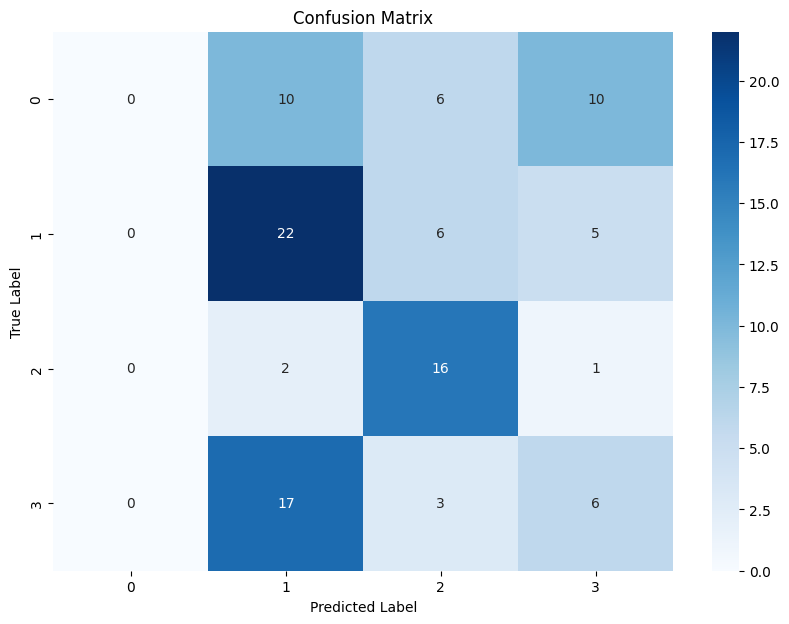

In [ ]:
y_pred = []
y_true = []

# Iterating through the test dataset
for images, labels in new_test_ds:
    # Load the model and get predictions for each batch
    model = tf.keras.models.load_model('model_penalty_2.keras', custom_objects={'CustomModel': CustomModel})
    preds = model.predict(images)

    # Append predicted labels
    y_pred.extend(np.argmax(preds, axis=1))

    # Append true labels
    true_labels = np.argmax(labels.numpy(), axis=1)
    y_true.extend(true_labels)

# Calculate the confusion matrix
cm = confusion_matrix(y_true, y_pred)

# Calculate the testing error rate
testing_error_rate = 1 - np.trace(cm) / np.sum(cm)

# Print the error rate
print(f'Testing Error Rate: {testing_error_rate:.4f}')

# Plotting the confusion matrix
plt.figure(figsize=(10, 7))  # Adjust the figure size as necessary
sns.heatmap(cm, annot=True, cmap="Blues", fmt="d")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()


Check with Adam Optimizer

In [ ]:
# Create and compile the model
model_penalty_adam = CustomModel(inputs=model_penalty_base.input, outputs=model_penalty_base.output, r=0.05, alpha=0.8)

In [ ]:
model_penalty_adam.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-3),
    loss='categorical_crossentropy',
    metrics=[
        tf.keras.metrics.CategoricalAccuracy(name='accuracy'),
        tf.keras.metrics.Precision(),
        tf.keras.metrics.Recall(),
        tf.keras.metrics.F1Score(average='weighted', threshold=0.3),
        # AUC for multi-class classification
        tf.keras.metrics.AUC(multi_label=True, num_labels=4, curve='ROC', name='ROC_AUC')
    ]
)

In [ ]:
# Train the model
penalty_history_adam = model_penalty_adam.fit(
    aug_ds,
    steps_per_epoch=150,
    epochs=20,
    validation_data=val_ds,
    callbacks=[
        tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', patience=3, verbose=1, restore_best_weights=True),
        tf.keras.callbacks.ModelCheckpoint('model_penalty_adam-{val_accuracy:.2f}.keras', monitor='val_accuracy', verbose=1, save_best_only=True, mode='max')
    ]
)

# Save the trained model
model_penalty_adam.save('model_penalty_adam.keras')


Epoch 1/20
150/150 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step - ROC_AUC: 0.6400 - accuracy: 0.7610 - f1_score: 0.7245 - precision_2: 0.9520 - recall_2: 0.4895 - loss: 0.6708
Epoch 1: val_accuracy improved from -inf to 0.74648, saving model to model_penalty_adam-0.75.keras
150/150 ━━━━━━━━━━━━━━━━━━━━ 49s 226ms/step - ROC_AUC: 0.6405 - accuracy: 0.7614 - f1_score: 0.7248 - precision_2: 0.9521 - recall_2: 0.4896 - loss: 0.6711 - val_ROC_AUC: 0.7982 - val_accuracy: 0.7465 - val_f1_score: 0.7880 - val_loss: 0.6720 - val_precision_2: 0.7727 - val_recall_2: 0.7183
Epoch 2/20
149/150 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step - ROC_AUC: 0.7610 - accuracy: 0.8608 - f1_score: 0.8148 - precision_2: 0.9902 - recall_2: 0.5257 - loss: 0.7602
Epoch 2: val_accuracy improved from 0.74648 to 0.78873, saving model to model_penalty_adam-0.79.keras
150/150 ━━━━━━━━━━━━━━━━━━━━ 22s 150ms/step - ROC_AUC: 0.7611 - accuracy: 0.8608 - f1_score: 0.8149 - precision_2: 0.9902 - recall_2: 0.5257 - loss: 0.7603 - val_ROC_AUC: 0.73

In [ ]:
# Evaluate the model on the new test dataset
penalty_adam_test_results = model_penalty_adam.evaluate(test_ds)
penalty_adam_new_test_results = model_penalty_adam.evaluate(new_test_ds)

# Print the results
print(tabulate([['Model', 'Loss', 'Accuracy', 'Precision', 'Recall', 'F1 Score', 'ROC AUC'],
                ['Test set', penalty_adam_test_results[0], penalty_adam_test_results[1], penalty_adam_test_results[2], penalty_adam_test_results[3], penalty_adam_test_results[4], penalty_adam_test_results[5]],
                ['New Test set', penalty_adam_new_test_results[0], penalty_adam_new_test_results[1], penalty_adam_new_test_results[2], penalty_adam_new_test_results[3], penalty_adam_new_test_results[4], penalty_adam_new_test_results[5]]]))

6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 141ms/step - ROC_AUC: 0.6193 - accuracy: 0.7341 - f1_score: 0.6430 - precision_11: 0.7466 - recall_11: 0.7341 - loss: 0.6195
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 428ms/step - ROC_AUC: 0.6854 - accuracy: 0.4268 - f1_score: 0.3397 - precision_11: 0.4570 - recall_11: 0.4149 - loss: 0.4065
------------  ------------------  -------------------  ------------------  -------------------  ------------------  ------------------
Model         Loss                Accuracy             Precision           Recall               F1 Score            ROC AUC
Test set      0.6091870665550232  0.7135416865348816   0.7210526466369629  0.7135416865348816   0.6156907677650452  0.6867882609367371
New Test set  0.3743216097354889  0.38461539149284363  0.4000000059604645  0.36538460850715637  0.3126242756843567  0.6711927652359009
------------  ------------------  -------------------  ------------------  -------------------  ------------------  ------------------


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step
Testing Error Rate: 0.6827


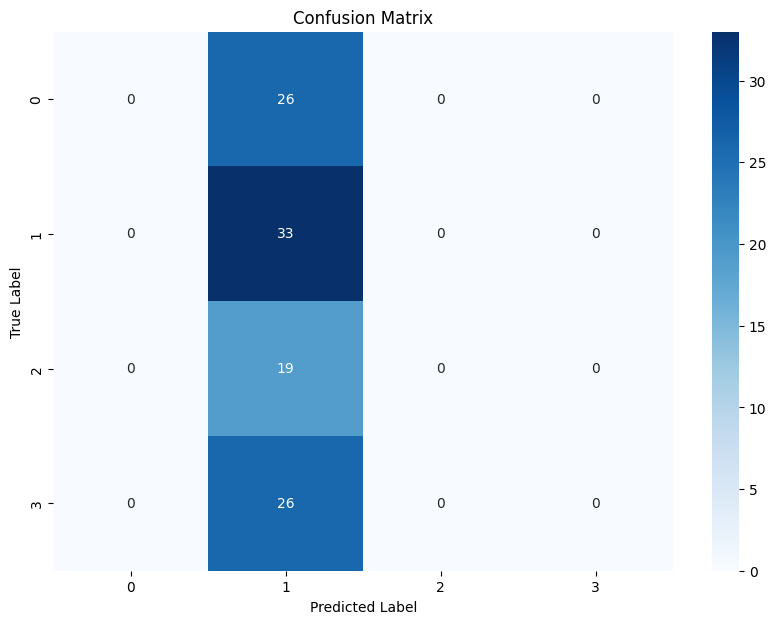

In [ ]:
y_pred = []
y_true = []

# Iterating through the test dataset
for images, labels in new_test_ds:
    # Load the model and get predictions for each batch
    model = tf.keras.models.load_model('model_penalty_adam.keras', custom_objects={'CustomModel': CustomModel})
    preds = model.predict(images)

    # Append predicted labels
    y_pred.extend(np.argmax(preds, axis=1))

    # Append true labels
    true_labels = np.argmax(labels.numpy(), axis=1)
    y_true.extend(true_labels)

# Calculate the confusion matrix
cm = confusion_matrix(y_true, y_pred)

# Calculate the testing error rate
testing_error_rate = 1 - np.trace(cm) / np.sum(cm)

# Print the error rate
print(f'Testing Error Rate: {testing_error_rate:.4f}')

# Plotting the confusion matrix
plt.figure(figsize=(10, 7))  # Adjust the figure size as necessary
sns.heatmap(cm, annot=True, cmap="Blues", fmt="d")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()


**Compare testing error rate with paper initilization**

| Author   | My implement with SGD | My implementation with Adam |
|---------|------------------------------|-----------------------------|
| 10%   | 57%            | 68%            |

As we see the testing error rate is high compare with author initilization. The main reason might due to the poor data. My model can classify good on speedlimit (class 1) and stop (class 2), showing that this penalty help on overfit for imbalanced dataset. However, due to the lack of Australia crosswalk sign in train dataset and least images class of traffic light, the model is still struggle to classify these class.

**3. What connections do you discover between the paper and what you have learnt in the unit?**

The concept of penalizing the gradient norm is closely connected to the topics covered in this unit, particularly around generalization and model optimization. Throughout the course, I have studied how deep neural networks rely on gradient-based optimization methods, such as gradient descent, to update model parameters during training. The gradient plays a crucial role in determining how the model's weights are adjusted based on the direction and magnitude of the loss function’s gradient.

When training deep neural networks, the gradient reflects how the loss function changes with respect to the model’s parameters. Large gradients indicate that the model’s parameters are far from optimal and require significant adjustment, while smaller gradients suggest the model is approaching a minimum in the loss function, leading to more stable performance. However, not all minima are equal in terms of generalization—some lead to better performance on unseen data, while others may cause overfitting.

The paper's approach of penalizing the gradient norm to guide the optimizer toward flat minima, which are associated with better generalization, directly ties into the broader optimization strategies that have explored in this unit. The unit covers techniques like regularization, dropout, and batch normalization, which aim to improve generalization by managing model complexity and preventing overfitting. The paper builds on these ideas by introducing a specific technique to enhance generalization through optimization, much like the gradient-based methods we’ve studied, further linking it to the core principles of model optimization and performance improvement we've learned.

#References

1. Road Signs Dataset. https://www.kaggle.com/datasets/andrewmvd/road-sign-detection

2. TensorFlow. (n.d.). Classify structured data with feature columns. TensorFlow. https://www.tensorflow.org/tutorials/structured_data/imbalanced_data

2. RandAugment: Practical automated data augmentation with a reduced search space, RandAugment, by Google Research, Brain Team
2020 NeurIPS, Over 600 Citations (Sik-Ho Tsang @ Medium)
Image Classification, Data Augmentation

4. Foret, P., Kleiner, A., Mobahi, H., & Neyshabur, B. (2021). Sharpness-aware Minimization for Efficiently Improving Generalization. In 9th International Conference on Learning Representations, ICLR 2021.
5. Gastaldi, X. (2017). Shake-Shake regularization. In 5th International Conference on Learning Representations, ICLR 2017.
6. Hochreiter, S., & Schmidhuber, J. (1997). Flat Minima. Neural Computation, 9(1), 1-42.
7. Krizhevsky, A. (2009). Learning Multiple Layers of Features from Tiny Images.
8. Neyshabur, B., Bhojanapalli, S., McAllester, D., & Srebro, N. (2017). Exploring Generalization in Deep Learning. In Advances in Neural Information Processing Systems (pp. 5947-5956).
9. Simonyan, K., & Zisserman, A. (2015). Very Deep Convolutional Networks for Large-Scale Image Recognition. In 3rd International Conference on Learning Representations (ICLR 2015) (pp. 1-14).
10. Yamada, Y., Iwamura, M., Akiba, T., & Kise, K. (2019). ShakeDrop Regularization for Deep Residual Learning. IEEE Access, 7, 186126-186136.
11. Zhao, Y., Zhang, H., & Hu, X. (2022). Penalizing Gradient Norm for Efficiently Improving Generalization in Deep Learning. In International Conference on Machine Learning (pp. 26982--26992). PMLR.
